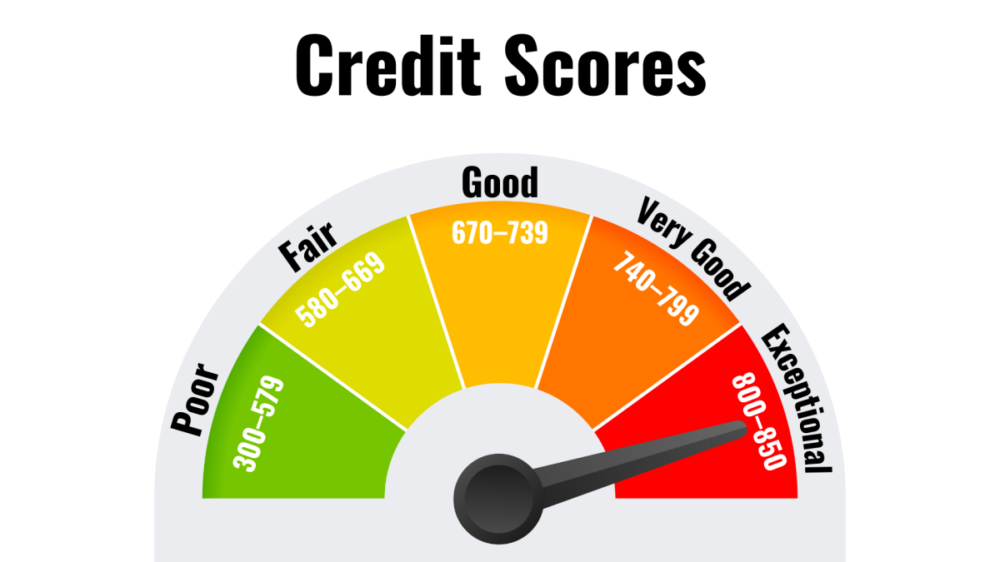

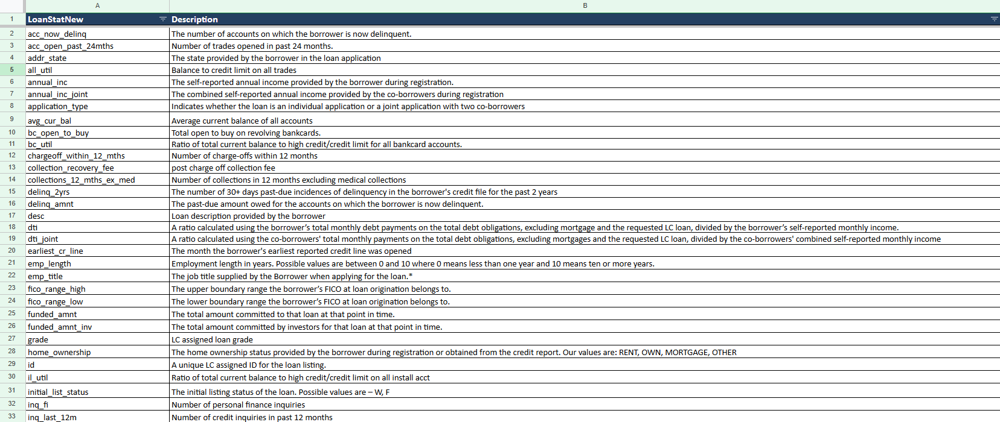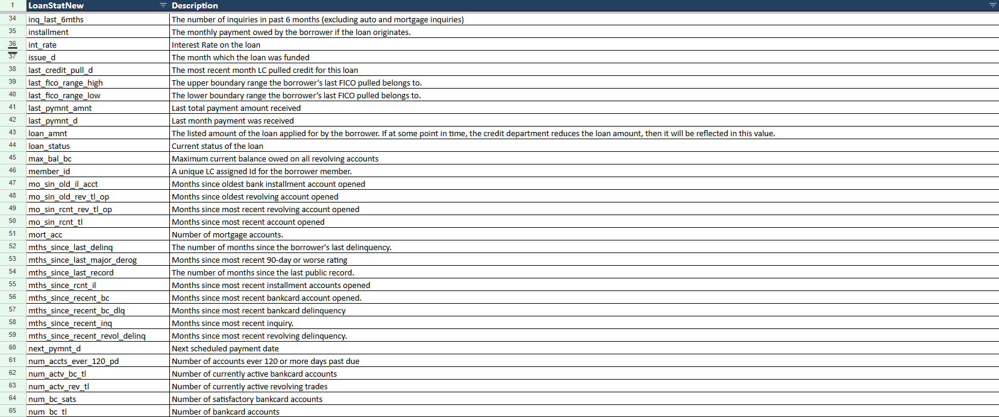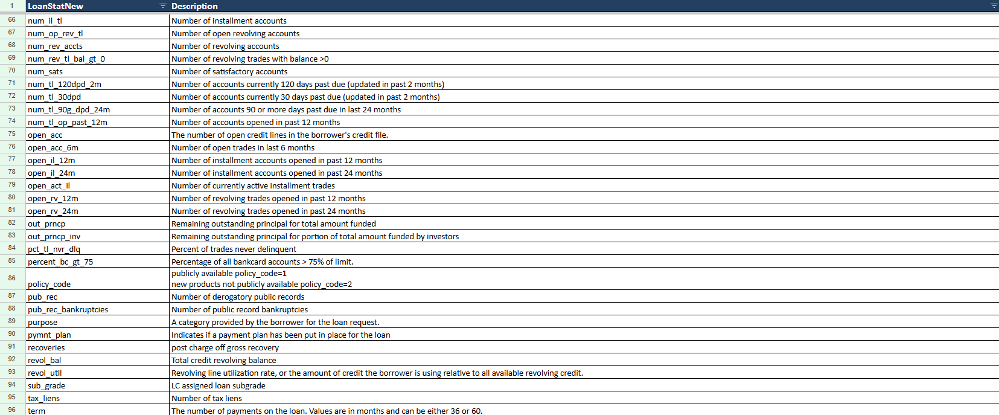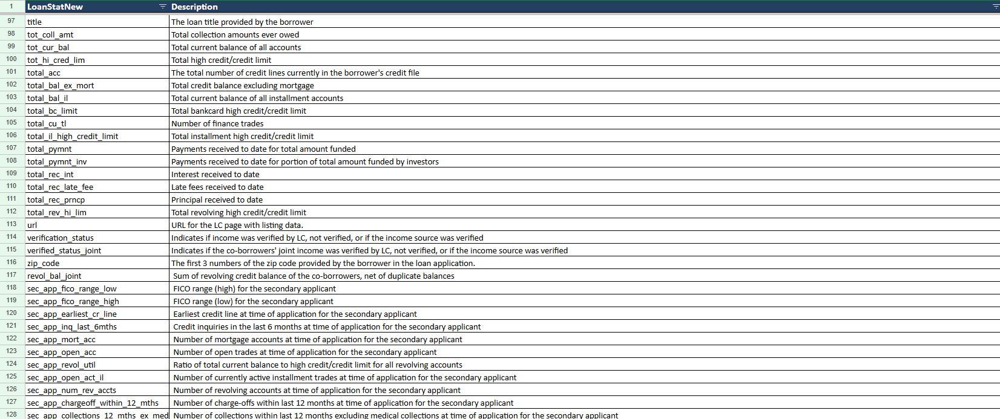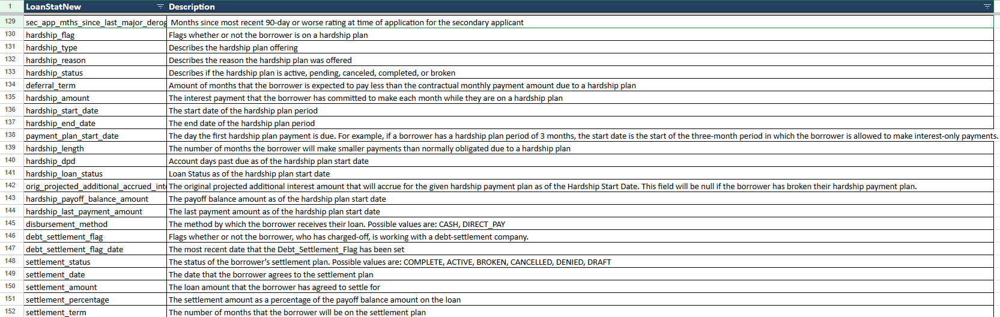

In [1]:
# pip installations
!pip -q install dill optbinning lightgbm xgboost catboost category_encoders pygam prettytable tabulate matplotlib-venn geopandas osmnx dask[dataframe] ortools==9.7.2996 openai shapely shap openai==0.28 scikit-learn==1.2.2 imbalanced-learn==0.12.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.6/9.6 MB 56.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.0/258.0 kB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.9/213.9 kB 16.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 522.0/522.0 kB 30.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.6/99.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.2/243.2 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/

In [2]:
# import libraries
import os
import re
import sys
import json
import time
import shap
import dill
import torch
import openai
import random
import pickle
import joblib
import hashlib
import warnings
import requests
import subprocess
import optbinning
import osmnx as ox
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import statsmodels.api as sm
import matplotlib.pylab as plt
from tqdm import tqdm
from sklearn import metrics
from sklearn.svm import SVC
from itertools import cycle
from osmnx import _overpass
from datetime import datetime
from tabulate import tabulate
from google.colab import drive
from tabulate import tabulate
from scipy.stats import ks_2samp
from sklearn.utils import shuffle
from pygam import LogisticGAM, s
from prettytable import PrettyTable
from matplotlib_venn import venn2
from sklearn.utils import resample
from sklearn.cluster import KMeans
from pygam import LinearGAM, s
from xgboost import XGBClassifier
from sklearn.utils import resample
from joblib import Parallel, delayed
from IPython.display import display
from sklearn.pipeline import Pipeline
from datetime import datetime, timedelta
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE
from sklearn.impute import SimpleImputer
from imblearn.combine import SMOTETomek
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from category_encoders import TargetEncoder
from sklearn import model_selection, metrics
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import RobustScaler
from scipy.interpolate import UnivariateSpline
from optbinning import BinningProcess, Scorecard
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.calibration import calibration_curve
from sklearn.preprocessing import RobustScaler
from sklearn.calibration import calibration_curve
from sklearn.feature_selection import VarianceThreshold
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import VarianceThreshold
from shapely.geometry import Point, MultiPolygon, Polygon
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM
from tenacity import retry, stop_after_attempt, wait_exponential
from sklearn.preprocessing import StandardScaler, LabelEncoder
from transformers import AutoModelForSeq2SeqLM, AutoTokenizer
from sklearn.linear_model import PoissonRegressor, BayesianRidge
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import precision_recall_curve, auc, brier_score_loss, roc_auc_score, log_loss
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, auc, brier_score_loss

warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings("ignore", category=ImportWarning)
warnings.filterwarnings("ignore", category=UserWarning, module="osmnx._overpass")
warnings.filterwarnings("ignore", category=ImportWarning, module="importlib._bootstrap")

pd.set_option("display.max_columns", None)
plt.style.use("ggplot")
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]
color_cycle = cycle(plt.rcParams["axes.prop_cycle"].by_key()["color"])

In [3]:
# openai key
openai.api_key = 'sk-proj-SsXeMUHILg0hasMiADv0T3BlbkFJvxTGTIL8EMl7im9EJsdp'

In [4]:
# mount google drive
drive.mount('/content/drive')

Mounted at /content/drive


# Load datasets

In [5]:
# Load credit dataset
train_df = pd.read_csv('/content/drive/MyDrive/FYP /AI Alignment/Test/data/Credit_Loan_Data.csv')

In [6]:
# Load meterological data
df_loaded = pd.read_csv('/content/drive/MyDrive/FYP /AI Alignment/Test/data/preprocessing.csv')

#Exploratory Data Analysis (EDA)

In [7]:
print(train_df.shape)

(100000, 147)


In [8]:
print(train_df.isna().sum())

id                           0
member_id                    0
loan_amnt                    0
funded_amnt                  0
funded_amnt_inv              0
                         ...  
settlement_status        99999
settlement_date          99999
settlement_amount        99999
settlement_percentage    99999
settlement_term          99999
Length: 147, dtype: int64


In [9]:
print(train_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Columns: 147 entries, id to settlement_term
dtypes: float64(54), int64(56), object(37)
memory usage: 112.2+ MB
None


In [10]:
print(tabulate(train_df.head(), headers='keys', tablefmt='pretty'))

+---+----+-----------+-----------+-------------+-----------------+-----------+----------+-------------+-------+-----------+----------------+------------+----------------+--------------------+-----------------+------------+---------------------+---------+-------------+------------+-----+------+--------------------+--------------------+----------+------------+-------+-------------+------------------+----------------+------------------------+------------------------+----------+---------+-----------+------------+-----------+---------------------+-----------+---------------+-------------+-----------------+-----------------+---------------+--------------------+------------+-------------------------+--------------+-----------------+--------------+--------------------+----------------------------+-----------------------------+-------------+------------------+------------------+-----------+---------------------------+----------------+--------------+-------------+-------------+-------------+----

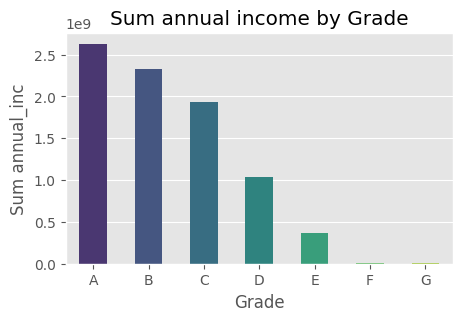

In [11]:
def plot_sum_of_numarical_col_by_grade(col):
    sum__by_grade = train_df.groupby('grade')[col].sum().reset_index()
    plt.figure(figsize=(5, 3))
    sns.barplot(x='grade', y=col, data=sum__by_grade, palette='viridis', width=.5)
    plt.title(f'Sum annual income by Grade')
    plt.xlabel('Grade')
    plt.ylabel(f'Sum {col}')
    plt.show()

plot_sum_of_numarical_col_by_grade('annual_inc')

<Axes: xlabel='grade', ylabel='annual_inc'>

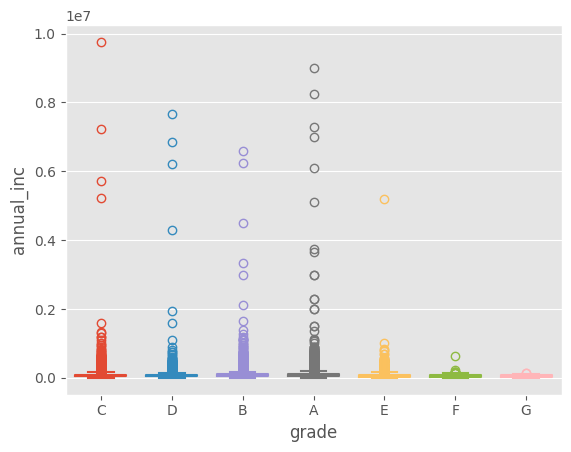

In [12]:
sns.boxplot(data=train_df, x="grade", y="annual_inc", hue="grade", fill=False, gap=.1)

In [13]:
# Partial Masking Function
def partial_mask(text, num_visible=4):
    if pd.isna(text):
        return text
    return '*' * (len(text) - num_visible) + text[-num_visible:]

# data anonymization for PII columns
def anonymize_pii_columns(df, pii_columns):
    def hash_text(text):
        if pd.isna(text):
            return text
        return hashlib.sha256(text.encode()).hexdigest()

    for col in pii_columns:
      # partial masking to SSNs
        if col == 'zip_code':
            df[col] = df[col].apply(lambda x: partial_mask(str(x), num_visible=4))
    return df

In [14]:
# PII columns
pii_columns = ['zip_code', 'member_id']

# anonymize PII columns in train set
train_df = anonymize_pii_columns(train_df, pii_columns)

In [15]:
# Numeric feature distribution
numeric_features = train_df.select_dtypes(include=['number']).columns.drop('id', 'member_id')

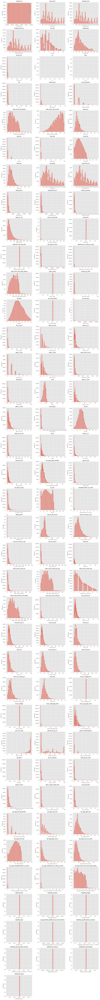

In [16]:
num_features = len(numeric_features)
num_rows = (num_features + 2) // 3

fig, axs = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))
axs = axs.flatten()

for i, col in enumerate(numeric_features):
    sns.histplot(train_df[col], ax=axs[i], kde=True, bins=30)
    axs[i].set_title(f'{col}', fontsize=12)
    axs[i].set_xlabel(col, fontsize=10)
    axs[i].set_ylabel('Frequency', fontsize=10)

for j in range(i + 1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

# Data Cleaning & Preprocessing

In [17]:
# drop columns where all records are empty
def drop_empty_columns(df):
    df.dropna(axis=1, how='all', inplace=True)

In [18]:
# convert binary columns
def convert_binary_columns(df):
    binary_map = {'Yes': 1, 'No': 0}
    object_cols = df.select_dtypes(include=['object']).columns

    for col in object_cols:
        if col not in ['grade', 'sub_grade']:
            unique_vals = df[col].dropna().unique()
            if set(unique_vals).issubset({'Yes', 'No'}):
                df[col] = df[col].map(binary_map).astype(int)

In [19]:
def clean_numeric_columns(df):
    def clean_column(column):
        if column.dtype == 'object' and column.name not in ['id', 'member_id',  'grade', 'sub_grade', 'zip_code', 'emp_title', 'loan_purpose', 'loan_issue_date', 'home_ownership',
                                                            'purpose', 'title', 'loan_status', 'verification_status', 'application_type', 'addr_state', 'verification_status_joint',
                                                            'issue_d', 'earliest_cr_line', 'last_pymnt_d', 'next_pymnt_d', 'last_credit_pull_d', 'disbursement_method', 'sec_app_earliest_cr_line']:

            return pd.to_numeric(column.str.replace(r'[^0-9.]', '', regex=True), errors='coerce')
        else:
            return column

    numeric_cols = df.select_dtypes(include=['float64', 'int64', 'object']).columns
    for col in numeric_cols:
        df[col] = clean_column(df[col])

In [20]:
def impute_numeric_columns(df):
    # Impute missing values in numeric columns with the median
    numeric_cols = df.select_dtypes(include=np.number).columns
    # Exclude columns that contain only NaN values
    cols_with_missing = [col for col in numeric_cols if df[col].notnull().any() and df[col].isnull().any()]

    if cols_with_missing:
        num_imputer = SimpleImputer(strategy='median')
        imputed_data = num_imputer.fit_transform(df[cols_with_missing])
        imputed_df = pd.DataFrame(imputed_data, columns=cols_with_missing, index=df.index)
        for col in cols_with_missing:
            df[col] = df[col].fillna(imputed_df[col])

    for col in cols_with_missing:
        if (df[col] % 1 == 0).all():
            df[col] = df[col].astype(int)

In [21]:
categorical_cols = train_df.select_dtypes(include=['object', 'category']).columns

def impute_categorical_columns(df):
    # Impute missing values in categorical columns with the most frequent value
    # Exclude columns that contain only NaN values
    cols_with_missing = [col for col in categorical_cols if df[col].notnull().any() and df[col].isnull().any()]

    if cols_with_missing:
        cat_imputer = SimpleImputer(strategy='most_frequent')
        imputed_data = cat_imputer.fit_transform(df[cols_with_missing])
        imputed_df = pd.DataFrame(imputed_data, columns=cols_with_missing, index=df.index)

        for col in cols_with_missing:
            df[col] = df[col].fillna(imputed_df[col])

In [22]:
def flatten_list_like_columns(df):
    # Flatten any list-like elements in categorical columns
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns

    for col in categorical_cols:
        if col not in ['grade', 'sub_grade']:
            df[col] = df[col].astype(object)
            if df[col].apply(lambda x: isinstance(x, list)).any():
                df[col] = df[col].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)
            df[col] = df[col].astype('category')

In [23]:
def map_grade_column(df):
    # Fill missing 'grade' values with the mode
    grade_mode = df['grade'].mode()[0]
    df['grade'] = df['grade'].fillna(grade_mode)
    grade_mapping = {'A': 1, 'B': 1, 'C': 1, 'D': 0, 'E': 0}
    df['grade'] = df['grade'].map(grade_mapping).fillna(grade_mapping.get(grade_mode, grade_mode))

In [24]:
def preprocess_dataset(df):
    drop_empty_columns(df)
    convert_binary_columns(df)
    clean_numeric_columns(df)
    impute_numeric_columns(df)
    impute_categorical_columns(df)
    flatten_list_like_columns(df)
    map_grade_column(df)

    return df

In [25]:
cleaned_dataset = preprocess_dataset(train_df)
cleaned_dataset['grade'] = cleaned_dataset['grade'].astype(int)
train_df = cleaned_dataset
train_df.head(10)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,loan_purpose,loan_issue_date,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_act_il,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,revol_bal_joint,sec_app_earliest_cr_line,sec_app_inq_last_6mths,sec_app_mort_acc,sec_app_open_acc,sec_app_revol_util,sec_app_open_act_il,sec_app_num_rev_accts,sec_app_chargeoff_within_12_mths,sec_app_collections_12_mths_ex_med,sec_app_mths_since_last_major_derog,hardship_flag,hardship_type,hardship_reason,hardship_status,deferral_term,hardship_amount,hardship_start_date,hardship_end_date,payment_plan_start_date,hardship_length,hardship_dpd,hardship_loan_status,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,1,100000,2500,2500,2500,36,13.56,84.92,1,C1,Chef,10,RENT,Vacation,24-Oct,55000.0,Not Verified,18-Dec,Current,NaN,debt_consolidation,Debt consolidation,*09xx,NY,18.24,0,1-Apr,1,34,45,9,1,4341,10.3,34,NaN,2386.02,2386.02,167.02,167.02,113.98,53.04,0.0,0,0,19-Feb,84.92,19-Mar,19-Feb,0,46,1,Individual,118000.0,18.6,Not Verified,0,0,16901,2,2,1,2,2,12560,69,2,7,2137,28,42000,1,11,2,9,1878,34360,5.9,0,0,140,212,1,1,0,1,38,2,35,0,2,5,3,3,16,7,18,5,9,0,0,0,3,100.0,0.0,1,0,60124,16901,36500,18124,28682,6-Aug,0,1,10,57.8,2,11,0,0,37,NaN,3,NaN,NaN,3,378.39,19,19,19,3,22,1630,1135.17,15351.85,1045.41,Cash,NaN,19,NaN,19,5443,65,18
1,2,100001,30000,30000,30000,60,18.94,777.23,0,D2,Postmaster,10,MORTGAGE,Credit Card Payoff,21-May,90000.0,Source Verified,18-Dec,Current,NaN,debt_consolidation,Debt consolidation,*13xx,LA,26.52,0,Jun-87,0,71,75,13,1,12315,24.2,44,NaN,29387.75,29387.75,1507.11,1507.11,612.25,894.86,0.0,0,0,19-Feb,777.23,19-Mar,19-Feb,0,46,1,Individual,118000.0,18.6,Not Verified,0,1208,321915,4,4,2,3,3,87153,88,4,5,998,57,50800,2,15,2,10,24763,13761,8.3,0,0,163,378,4,3,3,4,38,4,35,0,2,4,4,9,27,8,14,4,13,0,0,0,6,95.0,0.0,1,0,372872,99468,15000,94072,28682,6-Aug,0,1,10,57.8,2,11,0,0,37,NaN,3,NaN,NaN,3,378.39,19,19,19,3,22,1630,1135.17,15351.85,1045.41,Cash,NaN,19,NaN,19,5443,65,18
2,3,100002,5000,5000,5000,36,17.97,180.69,0,D1,Administrative,6,MORTGAGE,Debt Consolidation,11-Nov,59280.0,Source Verified,18-Dec,Current,NaN,debt_consolidation,Debt consolidation,*90xx,MI,10.51,0,11-Apr,0,34,90,8,0,4599,19.1,13,NaN,4787.21,4787.21,353.89,353.89,212.79,141.10,0.0,0,0,19-Feb,180.69,19-Mar,19-Feb,0,46,1,Individual,118000.0,18.6,Not Verified,0,0,110299,0,1,0,2,1

In [26]:
numeric_features = train_df.select_dtypes(include=['number']).columns.drop('id', 'grade')

#Remove Outliers

In [27]:
# Convert numeric features to numeric type
for col in numeric_features:
    train_df[col] = pd.to_numeric(train_df[col], errors='coerce')

grade_backup = train_df['grade'].copy()

# Calculate Q1, Q3, and IQR
Q1 = train_df[numeric_features].quantile(0.25)
Q3 = train_df[numeric_features].quantile(0.75)
IQR = Q3 - Q1

# Define outliers
outlier_mask = (train_df[numeric_features] < (Q1 - 1.5 * IQR)) | (train_df[numeric_features] > (Q3 + 1.5 * IQR))
outliers = outlier_mask.sum()

print("Outliers in each feature:")
print(outliers)

Outliers in each feature:
member_id                0
loan_amnt                0
funded_amnt              0
funded_amnt_inv          0
term                     0
                        ..
settlement_status        0
settlement_date          0
settlement_amount        0
settlement_percentage    0
settlement_term          0
Length: 124, dtype: int64


In [28]:
# Capping for columns with outliers
for col in numeric_features:
  if outliers[col] > 0:
    lower_bound = Q1[col] - 1.5 * IQR[col]
    upper_bound = Q3[col] + 1.5 * IQR[col]
    train_df[col] = train_df[col].clip(lower=lower_bound, upper=upper_bound)
    outliers_capped = True

if outliers_capped:
    print("")
    print("Outliers has been capped.")

train_df['grade'] = grade_backup


Outliers has been capped.


In [29]:
features_to_check = ['loan_amnt', 'annual_inc', 'funded_amnt', 'funded_amnt_inv']

# summary for capped features
print("Summary Statistics after Capping:")
print(train_df[features_to_check].describe())

Summary Statistics after Capping:
           loan_amnt     annual_inc    funded_amnt  funded_amnt_inv
count  100000.000000  100000.000000  100000.000000    100000.000000
mean    15934.297500   77511.984737   15934.297500     15931.464250
std     10146.154617   41272.067654   10146.154617     10148.296023
min      1000.000000       0.000000    1000.000000       725.000000
25%      8000.000000   47840.000000    8000.000000      8000.000000
50%     14000.000000   68613.000000   14000.000000     14000.000000
75%     21500.000000  100000.000000   21500.000000     21500.000000
max     40000.000000  178240.000000   40000.000000     40000.000000


- summary shows selcted features are within the range

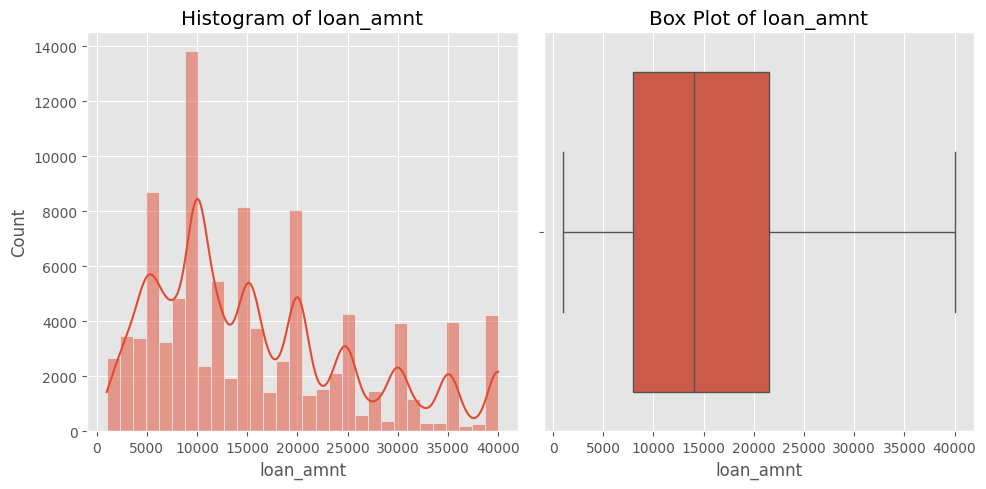

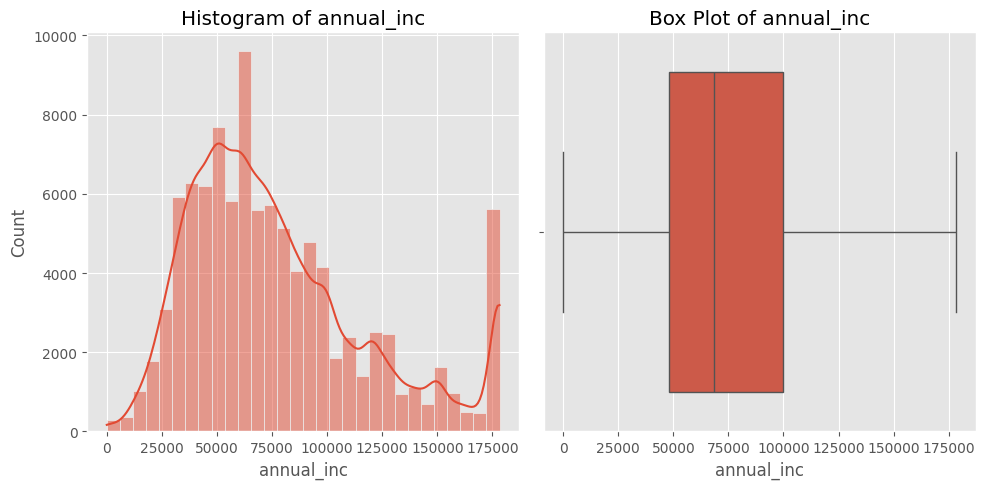

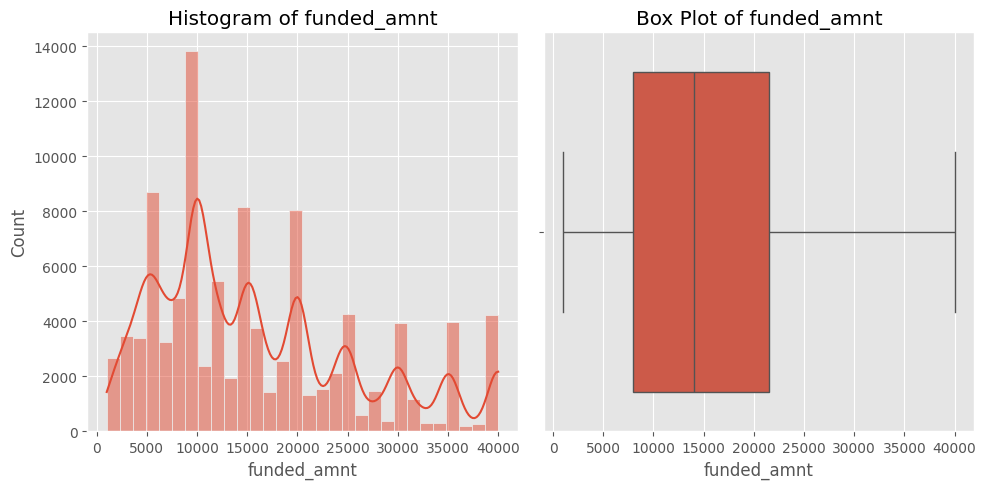

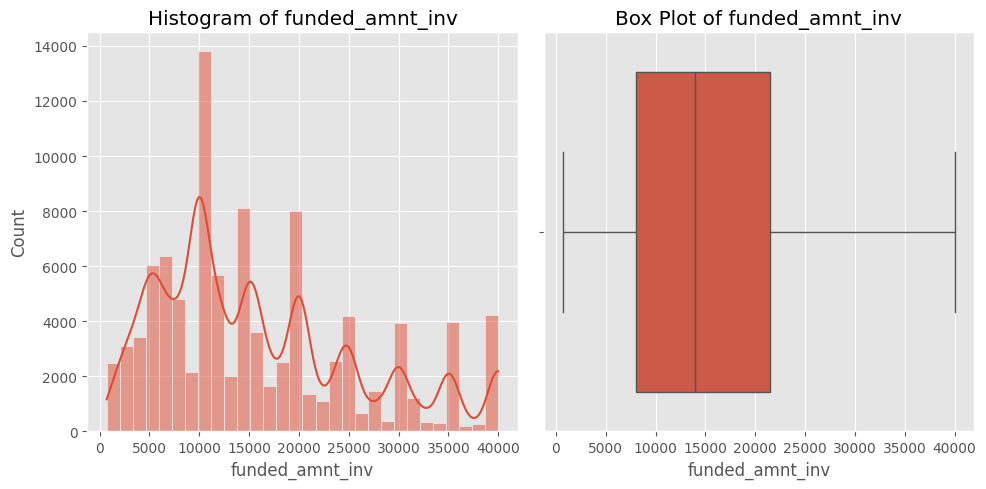

In [30]:
# Histograms and box plots to visualize distributions
def plot_feature_distributions(df, features):
    for feature in features:
        plt.figure(figsize=(10, 5))

        # Histogram
        plt.subplot(1, 2, 1)
        sns.histplot(df[feature], bins=30, kde=True)
        plt.title(f"Histogram of {feature}")

        # Box Plot
        plt.subplot(1, 2, 2)
        sns.boxplot(x=df[feature])
        plt.title(f"Box Plot of {feature}")

        plt.tight_layout()
        plt.show()

plot_feature_distributions(train_df, features_to_check)

In [31]:
# Display cleaned credit dataset as a dataframe
print("Credit Dataset Information:")
print(tabulate(train_df.head(15), headers='keys', tablefmt='pretty'))

Credit Dataset Information:
+----+----+-----------+-----------+-------------+-----------------+------+----------+-------------+-------+-----------+------------------------+------------+----------------+------------------------+-----------------+------------+---------------------+---------+-------------+------------+--------------------+-------------------------+----------+------------+-------+-------------+------------------+----------------+------------------------+------------------------+----------+---------+-----------+------------+-----------+---------------------+-----------+---------------+-------------+-----------------+-----------------+---------------+--------------------+------------+-------------------------+--------------+-----------------+--------------+--------------------+----------------------------+-----------------------------+-------------+------------------+------------------+-----------+---------------------------+----------------+--------------+-------------+----

#Feature Engineering

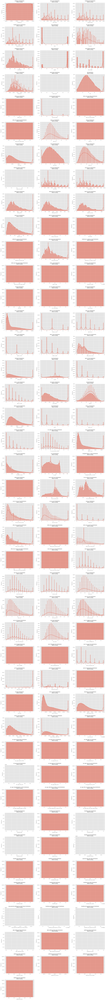

In [32]:
# Numeric feature distributions before scaling
features_to_plot = numeric_features

num_features = len(features_to_plot)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols

# Create subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 4))
axs = axs.flatten()

# Plot each feature
for i, feature in enumerate(features_to_plot):
    sns.histplot(train_df[feature], kde=True, ax=axs[i])
    axs[i].set_title(f'{feature.replace("_", " ")} Distribution\nBefore Scaling', fontsize=10)
    axs[i].tick_params(labelsize=8)
    axs[i].set_xlabel(feature, fontsize=9)
    axs[i].set_ylabel('Frequency', fontsize=9)

for j in range(i + 1, len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

In [33]:
# variance for each feature
variances = train_df.select_dtypes(include=['number']).drop(columns=['id', 'member_id']).var()
print(variances.sort_values().head(20))

policy_code                           0.0
mths_since_recent_bc_dlq              0.0
sec_app_open_act_il                   0.0
num_tl_90g_dpd_24m                    0.0
sec_app_chargeoff_within_12_mths      0.0
sec_app_collections_12_mths_ex_med    0.0
recoveries                            0.0
collection_recovery_fee               0.0
collections_12_mths_ex_med            0.0
num_tl_30dpd                          0.0
sec_app_open_acc                      0.0
annual_inc_joint                      0.0
num_tl_120dpd_2m                      0.0
acc_now_delinq                        0.0
tot_coll_amt                          0.0
delinq_amnt                           0.0
chargeoff_within_12_mths              0.0
tax_liens                             0.0
pub_rec_bankruptcies                  0.0
delinq_2yrs                           0.0
dtype: float64


In [34]:
# Set threshold for variance
variance_threshold = 0.01
selector = VarianceThreshold(threshold=variance_threshold)
selector.fit(train_df.select_dtypes(include=['number']).drop(columns=['id', 'member_id', 'grade']))

# Get low-variance columns
low_variance_columns = train_df.select_dtypes(include=['number']).drop(columns=['id', 'member_id', 'grade']).columns[~selector.get_support()]
train_df = train_df.drop(columns=low_variance_columns)

In [35]:
# print(train_df.head())

In [36]:
# Define target column and features to drop
target_col = 'grade'
drop_cols = ['member_id', target_col]
train_cols = [col for col in train_df.columns if col not in drop_cols]

#Feature Selection

In [37]:
# Feature Scaling
scaler = RobustScaler()

numeric_cols = train_df.select_dtypes(include=['number']).columns.drop('id', 'member_id')
numeric_features = [col for col in numeric_cols if col not in ('grade', 'member_id')]

train_df[numeric_features] = scaler.fit_transform(train_df[numeric_features])

In [39]:
train_df[numeric_features] = scaler.inverse_transform(train_df[numeric_features])

In [41]:
print("Train Data Distribution:\n", train_df['grade'].value_counts())

Train Data Distribution:
 grade
1    81790
0    18210
Name: count, dtype: int64


In [42]:
# print(train_df.head())

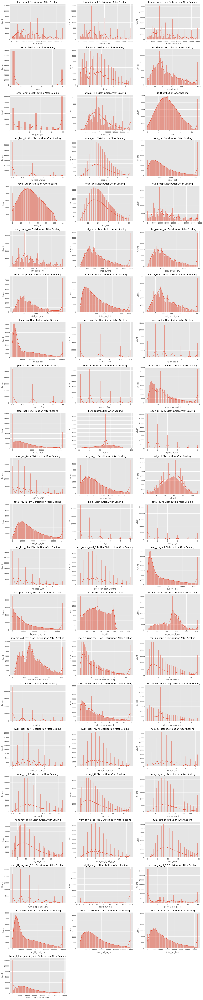

In [43]:
# Plot feature distributions after scaling
num_features = len(numeric_features)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols

# Plot feature distributions after scaling
fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, num_rows * 4))
axs = axs.flatten()

scaled_features = numeric_features

for i, feature in enumerate(scaled_features):
    sns.histplot(train_df[feature], kde=True, ax=axs[i])
    axs[i].set_title(f'{feature} Distribution After Scaling')

for j in range(len(scaled_features), len(axs)):
    axs[j].set_visible(False)

plt.tight_layout()
plt.show()

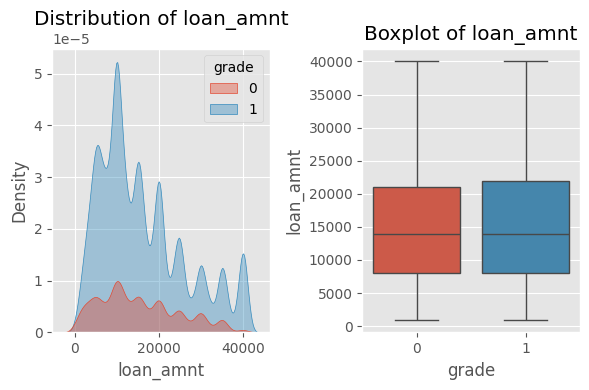

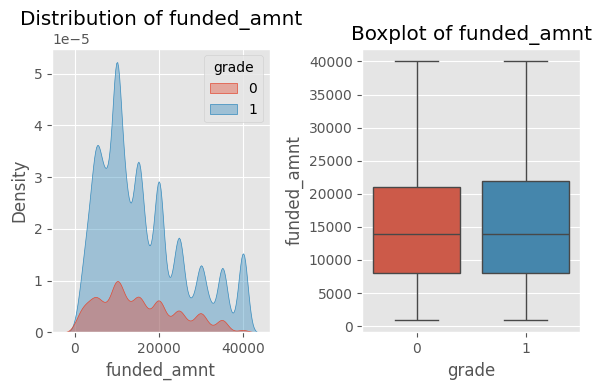

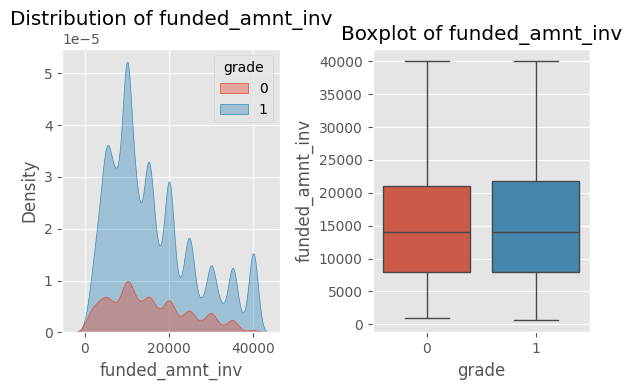

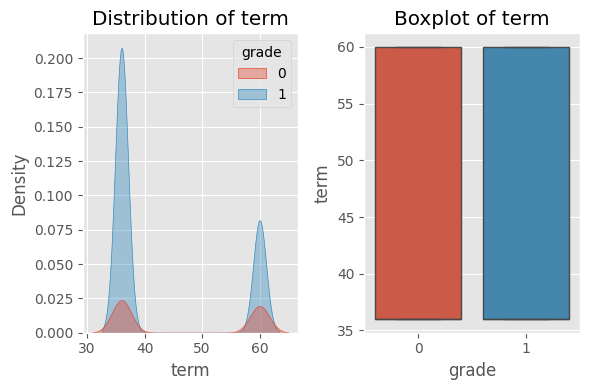

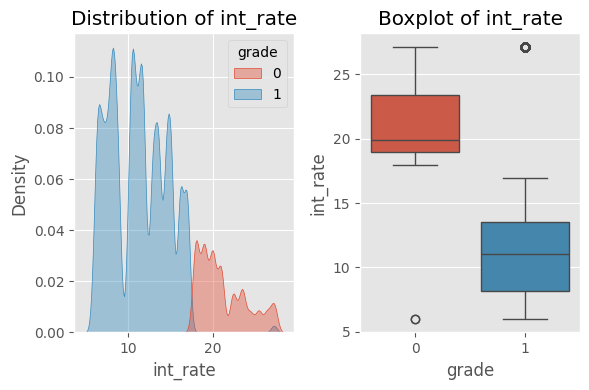

...

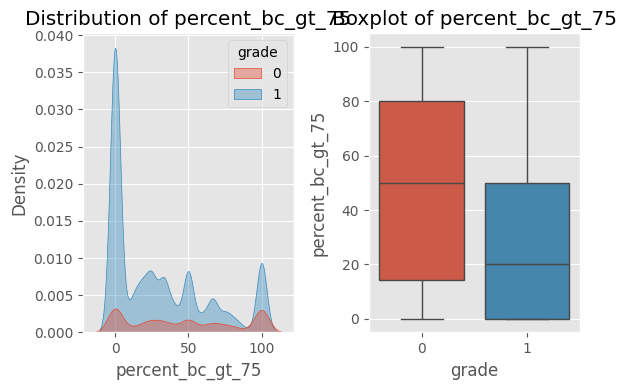

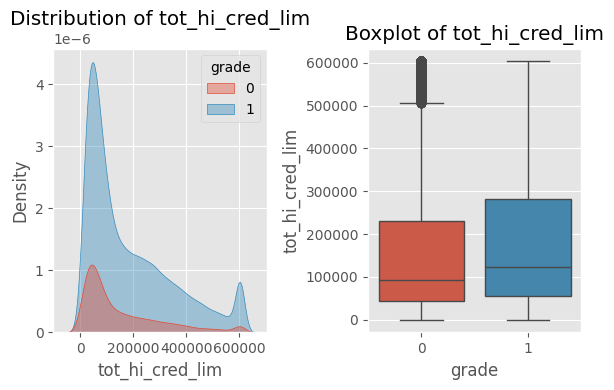

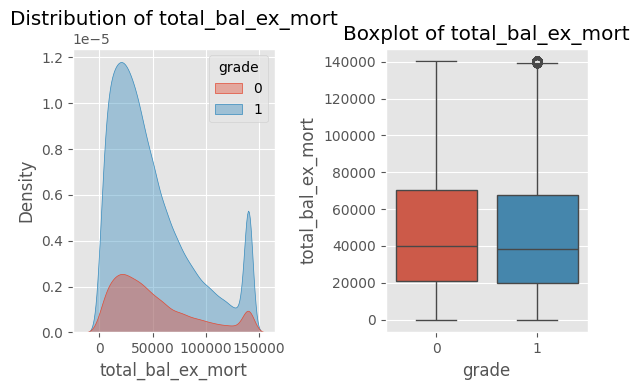

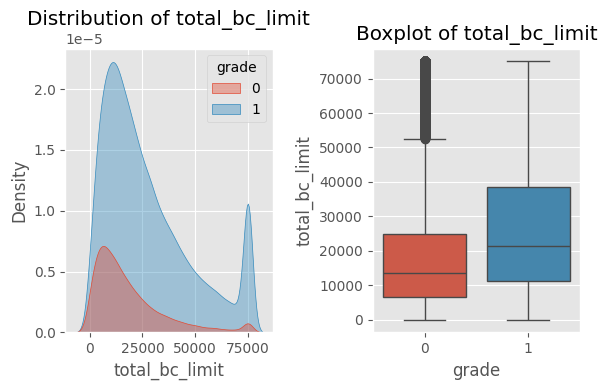

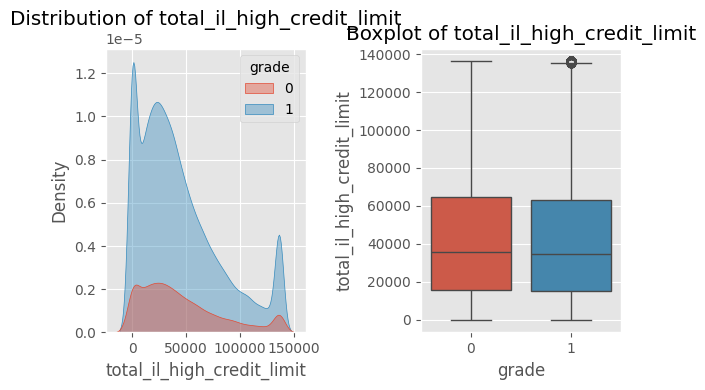

In [44]:
def plot_feature_vs_target(feature, target, data, bins=30):
    fig, axes = plt.subplots(1, 2, figsize=(6, 4))

    # Plot the distribution (density plot)
    sns.kdeplot(data=data, x=feature, hue=target, ax=axes[0], fill=True, alpha=0.4)
    axes[0].set_title(f"Distribution of {feature}")
    axes[0].set_xlabel(feature)
    axes[0].set_ylabel("Density")

    # Plot the boxplot
    sns.boxplot(data=data, x=target, y=feature, ax=axes[1], hue=target, legend=False)
    axes[1].set_title(f"Boxplot of {feature}")
    axes[1].set_xlabel(target)
    axes[1].set_ylabel(feature)

    plt.tight_layout()
    plt.show()

features_to_plot = scaled_features
target_variable = 'grade'

for feature in features_to_plot:
    plot_feature_vs_target(feature, target_variable, train_df)

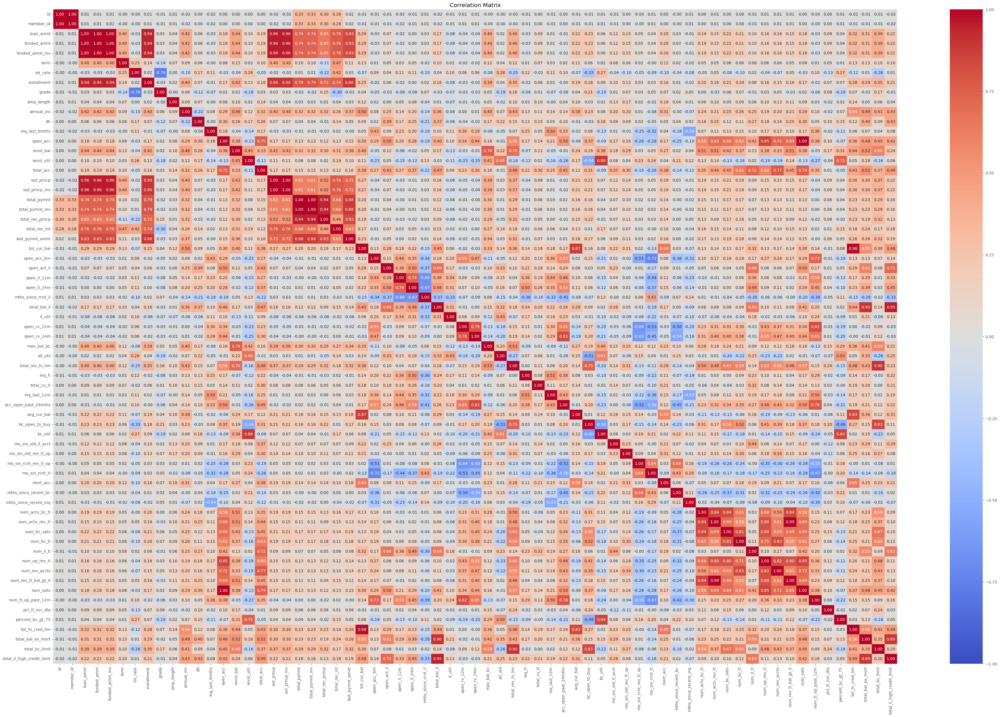

In [45]:
# Re-select numerical columns post variance thresholding
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns
corr_matrix = train_df[numeric_cols].corr()

plt.figure(figsize=(48,30))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

In [46]:
print("Train Data Distribution:\n", train_df['grade'].value_counts())

Train Data Distribution:
 grade
1    81790
0    18210
Name: count, dtype: int64


# **<span style="color:#F7B2B0;">Weight of Evidence(WOE)</span>**
The weight of evidence tells the predictive power of an independent variable in relation to the dependent variable. Since it evolved from credit scoring world, it is generally described as a measure of the separation of good and bad customers. "Bad Customers" refers to the customers who defaulted on a loan. and "Good Customers" refers to the customers who paid back loan.


- Distribution of Goods - % of Good Customers in a particular group
- Distribution of Bads - % of Bad Customers in a particular group
- ln - Natural Log

**Steps of Calculating WOE**

1. For a continuous variable, split data into 10 parts (or lesser depending on the distribution).
2. Calculate the number of events and non-events in each group (bin)
3. Calculate the % of events and % of non-events in each group.
4. Calculate WOE by taking natural log of division of % of non-events and % of events

# **<span style="color:#F7B2B0;">Information Value(IV)</span>**

Information value is one of the most useful technique to select important variables in a predictive model. It helps to rank variables on the basis of their importance.

If the IV statistic is:
- Less than 0.02, then the predictor is not useful for modeling (separating the Goods from the Bads)
- 0.02 to 0.1, then the predictor has only a weak relationship to the Goods/Bads odds ratio
- 0.1 to 0.3, then the predictor has a medium strength relationship to the Goods/Bads odds ratio
- 0.3 to 0.5, then the predictor has a strong relationship to the Goods/Bads odds ratio.
- 0.5, suspicious relationship (Check once)


In [47]:
# IV Analysis & Optimal binning
iv_score_dict = {}

for col in tqdm(train_cols):
    if col in categorical_cols:
        optb = optbinning.OptimalBinning(dtype='categorical')
        optb.fit(train_df[col], train_df['grade'])
    else:
        try:
          train_df[col] = pd.to_numeric(train_df[col], errors='coerce')
          optb = optbinning.OptimalBinning(dtype='numerical')
          optb.fit(train_df[col], train_df['grade'])
        except ValueError as e:
            print(f"Skipping column '{col}' as it has no valid samples.")
            continue

    # Build the binning table to compute Information Value
    binning_table = optb.binning_table
    binning_table.build()
    iv_score_dict[col] = binning_table.iv

# Convert the IV scores into a DataFrame
iv_score_df = pd.Series(iv_score_dict)
iv_score_df.sort_values(ascending=False, inplace=True)

100%|██████████| 85/85 [00:11<00:00,  7.38it/s]


In [48]:
# top 10 important iv features
iv_score_df.head(20)

,0
emp_title,3.108839
total_rec_int,0.565147
disbursement_method,0.519084
int_rate,0.514437
bc_open_to_buy,0.426730
all_util,0.286359
total_rec_prncp,0.259606
bc_util,0.255098
percent_bc_gt_75,0.249646
total_bc_limit,0.236092


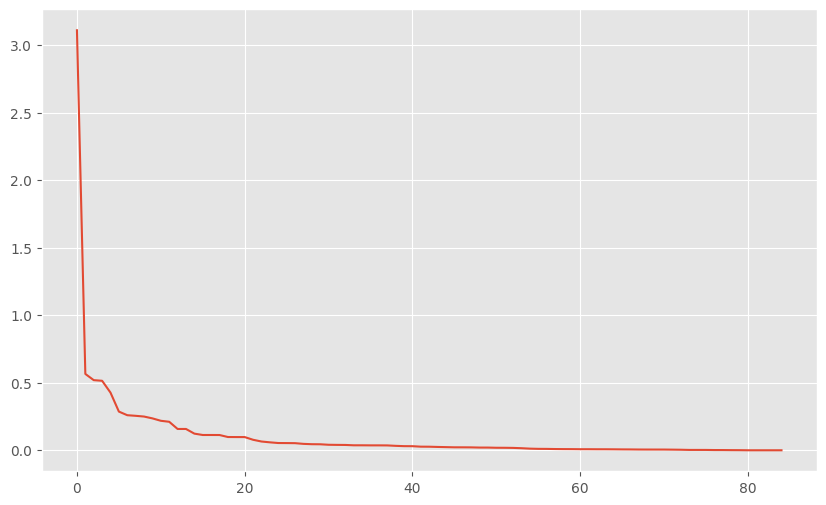

In [49]:
# iv score vs features
fig, ax = plt.subplots(figsize=(10,6))
iv_score_df.reset_index(drop=True).plot()
plt.show()

- This shows the predictive power of an independent variable in relation to the dependent variable.


In [50]:
# WOE for a selected feature
col = 'int_rate'
optb = optbinning.OptimalBinning(dtype='numerical')
optb.fit(train_df[col], train_df['grade'])
binning_table = optb.binning_table
display(binning_table.build())

,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 6.57)",6347,0.06347,2,6345,0.999685,-6.560091,0.508190,0.026509
1,"[6.57, inf)",93653,0.93653,18208,75445,0.805580,0.080641,0.006247,0.000781
2,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
3,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
Totals,,100000,1.00000,18210,81790,0.817900,,0.514437,0.027290


- `int_rate` is a continuous feature, os we splited into 15 bins
- each bin have non-event and event counts and rates
- each bin have WOE and IV values
- for missing values it's created 16th bin

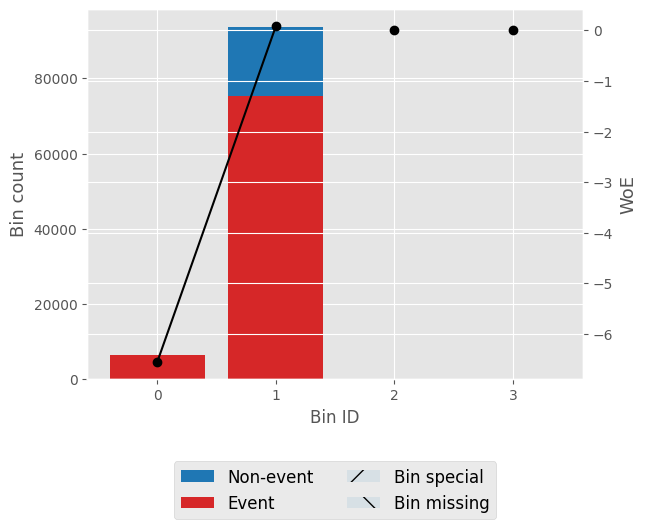

None

In [51]:
display(binning_table.plot(metric="woe"))

----------------------------------------------------------------------------------------------------
Feature Name :  emp_title





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"[Business Intelligence Engineer, Risk manager ...",6057,0.06057,5875,182,0.030048,4.976639,1.594514,1.059310e-01
1,"[Resident, Area Manager , Union Carpenter , Ul...",6108,0.06108,2465,3643,0.596431,1.111568,0.100957,1.200764e-02
2,"[Medical assistant, Maintenance Supervisor, St...",9451,0.09451,2308,7143,0.755793,0.372433,0.014678,1.824172e-03
3,"[Lineman, Production , Merchandiser, Librarian...",5447,0.05447,1089,4358,0.800073,0.115431,0.000753,9.401675e-05
4,"[Customer Service Manager, Rn, Maintenance, Ph...",23091,0.23091,4195,18896,0.818327,-0.002873,0.000002,2.379987e-07
5,"[Warehouse Manager, Teacher , Analyst, RN, Reg...",5010,0.05010,843,4167,0.831737,-0.095801,0.000446,5.571431e-05
6,"[Claims Adjuster, Mechanical Engineer, Sales A...",8147,0.08147,1121,7026,0.862403,-0.333212,0.008112,1.009273e-03
7,"[Regional Sales Manager, Office manager, COO, ...",36689,0.36689,314,36375,0.991442,-3.25006,1.389379,1.233025e-01
8,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000e+00
9,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000e+00


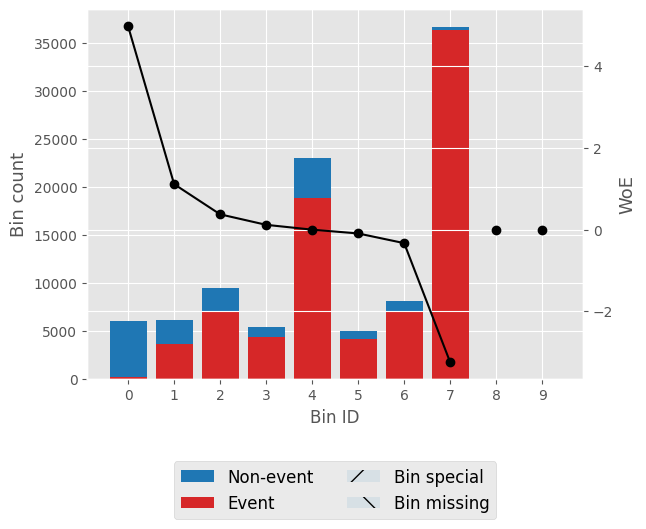

None

----------------------------------------------------------------------------------------------------
Feature Name :  total_rec_int





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 209.86)",31976,0.31976,3018,28958,0.905617,-0.759068,0.142948,0.017451
1,"[209.86, 271.30)",9723,0.09723,919,8804,0.905482,-0.757491,0.043309,0.005288
2,"[271.30, 419.58)",18626,0.18626,2520,16106,0.864705,-0.352749,0.020648,0.002568
3,"[419.58, 569.64)",12886,0.12886,2525,10361,0.804051,0.090376,0.001083,0.000135
4,"[569.64, 662.96)",5906,0.05906,1367,4539,0.768540,0.302096,0.005913,0.000736
5,"[662.96, 832.21)",7667,0.07667,1934,5733,0.747750,0.415536,0.015006,0.001862
6,"[832.21, 1185.58)",8194,0.08194,3077,5117,0.624481,0.993571,0.105726,0.012698
7,"[1185.58, inf)",5022,0.05022,2850,2172,0.432497,1.773855,0.230515,0.025546
8,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
9,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000


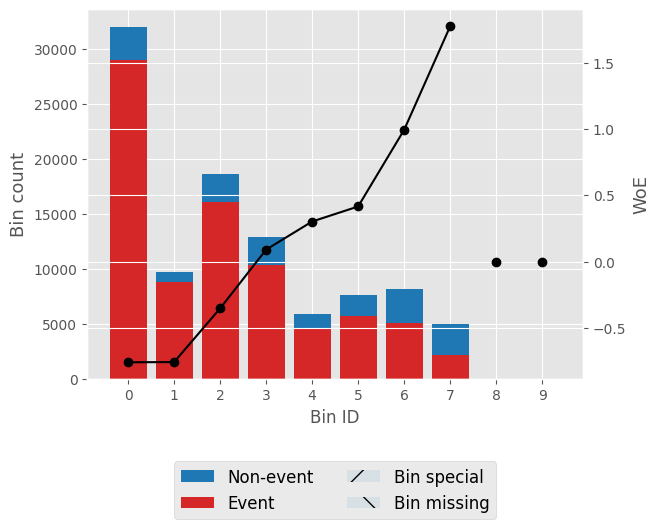

None

----------------------------------------------------------------------------------------------------
Feature Name :  disbursement_method





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,[Cash],80367,0.80367,17754,62613,0.779088,0.241822,0.050644,0.006315
1,[DirectPay],19633,0.19633,456,19177,0.976774,-2.23679,0.468440,0.048766
2,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
3,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
Totals,,100000,1.00000,18210,81790,0.817900,,0.519084,0.055081


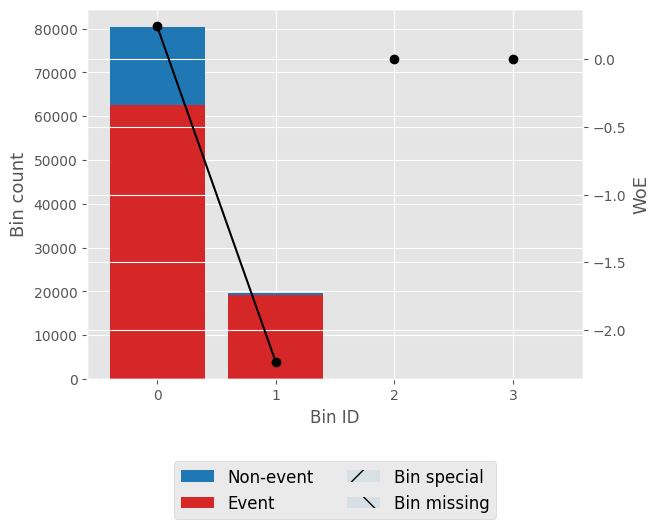

None

----------------------------------------------------------------------------------------------------
Feature Name :  int_rate





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 6.57)",6347,0.06347,2,6345,0.999685,-6.560091,0.508190,0.026509
1,"[6.57, inf)",93653,0.93653,18208,75445,0.805580,0.080641,0.006247,0.000781
2,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
3,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
Totals,,100000,1.00000,18210,81790,0.817900,,0.514437,0.027290


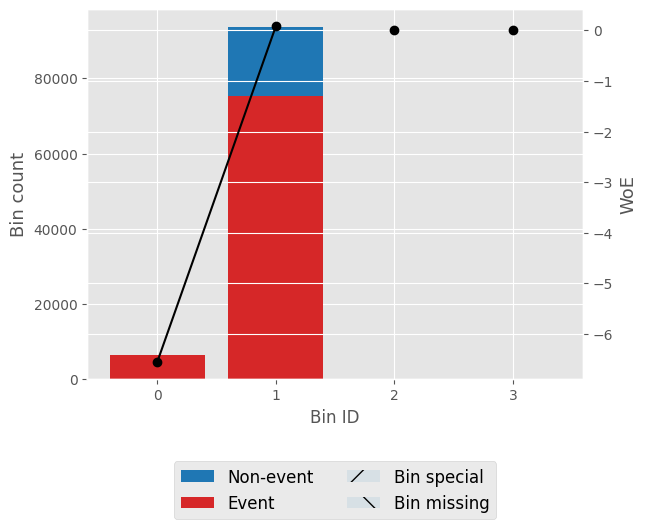

None

----------------------------------------------------------------------------------------------------
Feature Name :  bc_open_to_buy





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 329.50)",5144,0.05144,2053,3091,0.600894,1.092992,0.081918,0.009759
1,"[329.50, 853.50)",5031,0.05031,1653,3378,0.671437,0.787492,0.038960,0.004748
2,"[853.50, 2129.50)",9296,0.09296,2560,6736,0.724613,0.534725,0.031134,0.003846
3,"[2129.50, 2998.50)",5336,0.05336,1341,3995,0.748688,0.410556,0.010180,0.001264
4,"[2998.50, 4313.50)",7305,0.07305,1688,5617,0.768925,0.299931,0.007204,0.000897
5,"[4313.50, 5504.50)",5605,0.05605,1197,4408,0.786441,0.198581,0.002351,0.000293
6,"[5504.50, 8516.50)",12952,0.12952,2611,10341,0.798410,0.125801,0.002132,0.000266
7,"[8516.50, 11799.50)",9413,0.09413,1512,7901,0.839371,-0.151372,0.002054,0.000257
8,"[11799.50, 16200.50)",9229,0.09229,1188,8041,0.871275,-0.410098,0.013564,0.001684
9,"[16200.50, 22712.50)",9289,0.09289,1008,8281,0.891485,-0.603811,0.027711,0.003412


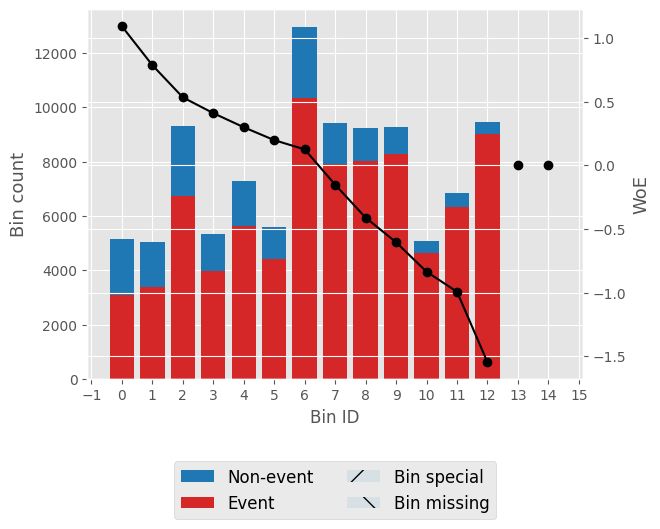

None

----------------------------------------------------------------------------------------------------
Feature Name :  all_util





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 27.50)",10394,0.10394,757,9637,0.927170,-1.041818,7.944441e-02,9.504489e-03
1,"[27.50, 34.50)",6956,0.06956,611,6345,0.912162,-0.838141,3.689811e-02,4.481832e-03
2,"[34.50, 39.50)",6319,0.06319,657,5662,0.896028,-0.651664,2.160071e-02,2.653304e-03
3,"[39.50, 43.50)",5875,0.05875,671,5204,0.885787,-0.54623,1.462720e-02,1.806003e-03
4,"[43.50, 48.50)",8385,0.08385,1180,7205,0.859273,-0.307077,7.152398e-03,8.905535e-04
5,"[48.50, 53.50)",8935,0.08935,1407,7528,0.842529,-0.174986,2.585473e-03,3.227724e-04
6,"[53.50, 56.50)",5667,0.05667,971,4696,0.828657,-0.073956,3.026997e-04,3.782885e-05
7,"[56.50, 59.50)",5763,0.05763,1049,4714,0.817977,-0.000515,1.530510e-08,1.913137e-09
8,"[59.50, 64.50)",9377,0.09377,1995,7382,0.787245,0.193784,3.739956e-03,4.667644e-04
9,"[64.50, 70.50)",10027,0.10027,2346,7681,0.766032,0.316146,1.103953e-02,1.374223e-03


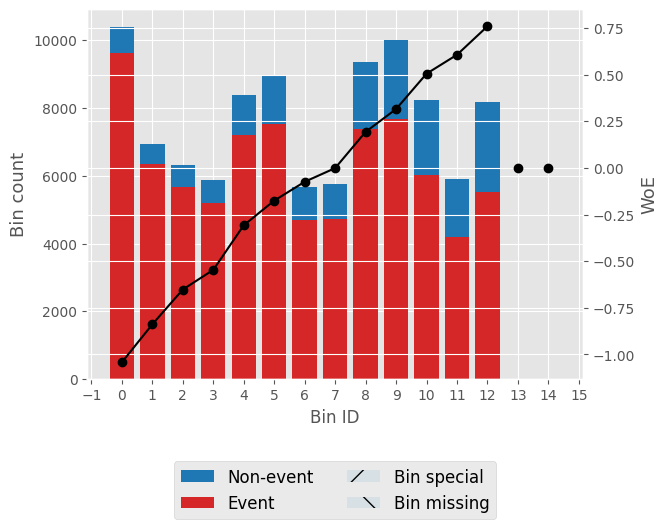

None

----------------------------------------------------------------------------------------------------
Feature Name :  total_rec_prncp





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 213.90)",6942,0.06942,2705,4237,0.610343,1.053431,0.101910,0.012181
1,"[213.90, 343.32)",11719,0.11719,3010,8709,0.743152,0.439767,0.025864,0.003207
2,"[343.32, 426.85)",8826,0.08826,2176,6650,0.753456,0.385056,0.014705,0.001827
3,"[426.85, 649.91)",20615,0.20615,4041,16574,0.803978,0.090841,0.001751,0.000219
4,"[649.91, 866.47)",15632,0.15632,2167,13465,0.861374,-0.324566,0.014809,0.001843
5,"[866.47, 987.14)",5956,0.05956,781,5175,0.868872,-0.388835,0.007926,0.000985
6,"[987.14, 1300.04)",10590,0.10590,1382,9208,0.869500,-0.394357,0.014468,0.001797
7,"[1300.04, inf)",19720,0.19720,1948,17772,0.901217,-0.708637,0.078173,0.009572
8,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
9,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000


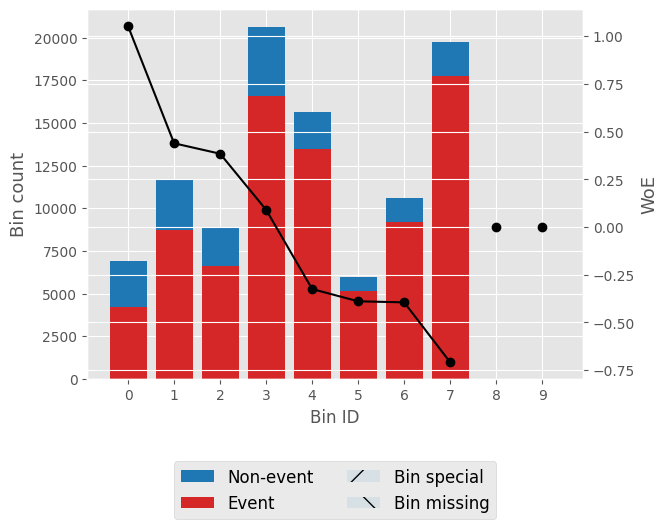

None

----------------------------------------------------------------------------------------------------
Feature Name :  bc_util





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 22.45)",20461,0.20461,2006,18455,0.901960,-0.717009,0.082800,0.010134
1,"[22.45, 30.85)",8871,0.08871,1022,7849,0.884793,-0.536441,0.021373,0.002640
2,"[30.85, 39.15)",9250,0.09250,1220,8030,0.868108,-0.38215,0.011916,0.001481
3,"[39.15, 47.75)",9429,0.09429,1382,8047,0.853431,-0.259584,0.005839,0.000728
4,"[47.75, 56.25)",10232,0.10232,1915,8317,0.812842,0.0336,0.000117,0.000015
5,"[56.25, 61.65)",5333,0.05333,1001,4332,0.812301,0.037154,0.000074,0.000009
6,"[61.65, 67.55)",5566,0.05566,1146,4420,0.794107,0.152322,0.001354,0.000169
7,"[67.55, 73.35)",5164,0.05164,1082,4082,0.790473,0.174408,0.001659,0.000207
8,"[73.35, 80.25)",6013,0.06013,1423,4590,0.763346,0.331071,0.007292,0.000907
9,"[80.25, 86.75)",5548,0.05548,1397,4151,0.748198,0.413162,0.010727,0.001331


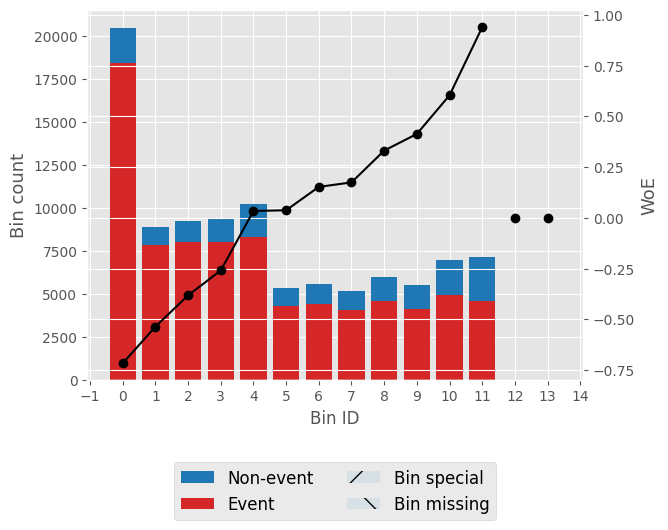

None

----------------------------------------------------------------------------------------------------
Feature Name :  percent_bc_gt_75





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 10.15)",38900,0.38900,4272,34628,0.890180,-0.590396,0.111455,0.013733
1,"[10.15, 18.05)",5517,0.05517,702,4815,0.872757,-0.423374,0.008603,0.001067
2,"[18.05, 30.20)",11262,0.11262,2000,9262,0.822412,-0.030589,0.000104,0.000013
3,"[30.20, 41.45)",9188,0.09188,1735,7453,0.811167,0.044575,0.000185,0.000023
4,"[41.45, 62.00)",12418,0.12418,2702,9716,0.782413,0.222402,0.006580,0.000821
5,"[62.00, 72.05)",5358,0.05358,1333,4025,0.751213,0.397091,0.009526,0.001183
6,"[72.05, 89.45)",5135,0.05135,1504,3631,0.707108,0.620804,0.023713,0.002917
7,"[89.45, inf)",12222,0.12222,3962,8260,0.675830,0.767508,0.089478,0.010918
8,Special,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000
9,Missing,0,0.00000,0,0,0.000000,0.0,0.000000,0.000000


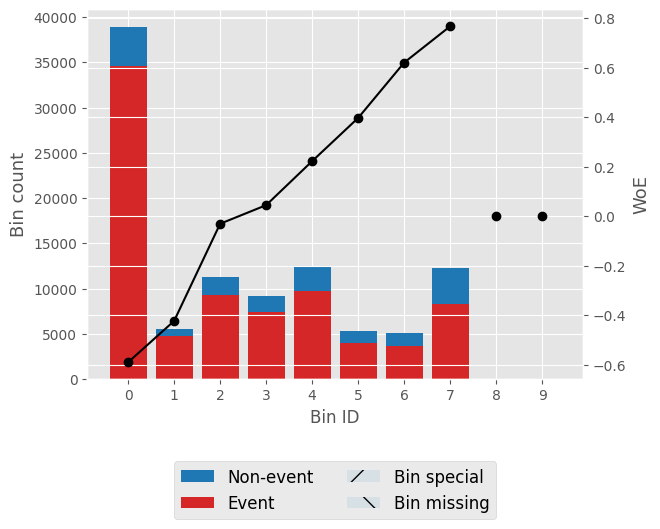

None

----------------------------------------------------------------------------------------------------
Feature Name :  total_bc_limit





,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS
0,"(-inf, 2925.00)",5369,0.05369,1846,3523,0.656174,0.855892,0.049898,0.006054
1,"[2925.00, 6625.00)",9713,0.09713,2765,6948,0.715330,0.580771,0.038848,0.004789
2,"[6625.00, 9375.00)",7727,0.07727,1927,5800,0.750615,0.400291,0.013973,0.001735
3,"[9375.00, 13475.00)",11761,0.11761,2554,9207,0.782842,0.219881,0.006087,0.000759
4,"[13475.00, 18402.50)",12579,0.12579,2398,10181,0.809365,0.056296,0.000406,0.000051
5,"[18402.50, 21680.00)",6852,0.06852,1188,5664,0.826620,-0.059675,0.000239,0.000030
6,"[21680.00, 25155.00)",6450,0.06450,1052,5398,0.836899,-0.133151,0.001096,0.000137
7,"[25155.00, 28925.00)",5902,0.05902,871,5031,0.852423,-0.251548,0.003441,0.000429
8,"[28925.00, 36475.00)",9105,0.09105,1230,7875,0.864909,-0.354495,0.010187,0.001267
9,"[36475.00, 42825.00)",5765,0.05765,683,5082,0.881526,-0.504781,0.012432,0.001538


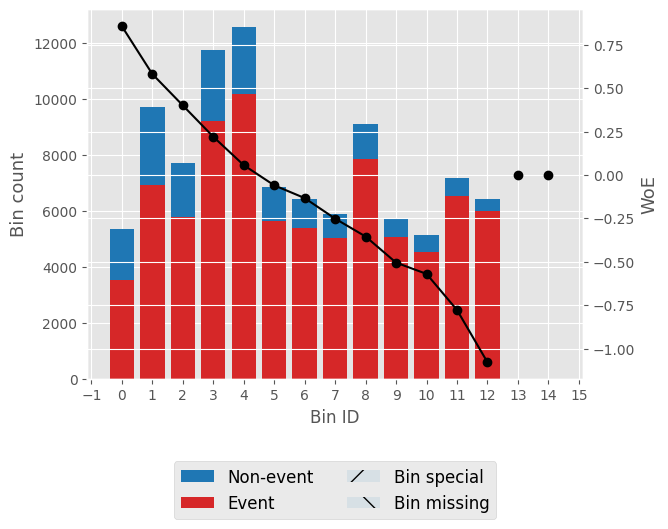

None

In [52]:
# WOE plots for top 10 features
top10_features = iv_score_df[:10].index.values

for col in top10_features:
    print("-"*100)
    print("="*100)
    print("Feature Name : ", col)
    print("\n\n")

    if col in categorical_cols:
        optb = optbinning.OptimalBinning(dtype='categorical')
        optb.fit(train_df[col], train_df['grade'])
    else:
        optb = optbinning.OptimalBinning(dtype='numerical')
        optb.fit(train_df[col], train_df['grade'])

    binning_table = optb.binning_table
    display(binning_table.build())
    display(binning_table.plot(metric="woe"))

- Select features with IV values between >= 0.02 & <= 0.5

In [53]:
selected_features = iv_score_df[(iv_score_df >= 0.02) & (iv_score_df <= 0.5)].index.values
cat_cols = [col for col in categorical_cols if col in selected_features]
train_cols = [col for col in train_df.columns if col in selected_features]

#Correlation Heatmap

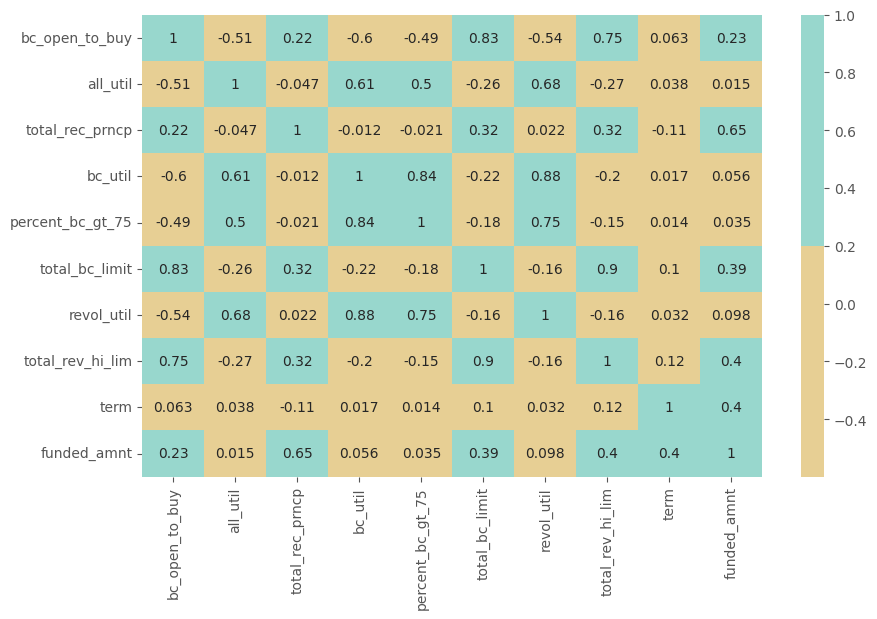

In [54]:
# numeric columns for correlation heatmap calculation
numeric_cols = train_df.select_dtypes(include=['float64', 'int64']).columns
top_cols = [col for col in selected_features if col in numeric_cols]

if not top_cols:
    print("No numeric features selected for correlation analysis.")
else:
    top_cols = top_cols[:10]
    corr_df = train_df[top_cols].corr()
    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_df, annot=True, cmap=sns.color_palette("BrBG", 2));
    plt.show()

In [55]:
def drop_feature_selection(row, col, corr, row_iv, col_iv):
    if row_iv >= col_iv:
        return col
    else:
        return row

In [56]:
# Filter out only numeric columns from train_cols
numeric_train_cols = train_df[train_cols].select_dtypes(include=['float64', 'int64']).columns
cor_matrix = train_df[numeric_train_cols].corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool_))
corr_df = upper_tri.stack().reset_index()
corr_df.columns = ['row', 'col', 'corr']
corr_df = corr_df.drop_duplicates()
corr_df = corr_df.sort_values('corr', ascending=False)
# drop out highly correlated features
corr_df = corr_df.query("corr >= 0.8")
corr_df['row_iv'] = corr_df['row'].map(iv_score_dict)
corr_df['col_iv'] = corr_df['col'].map(iv_score_dict)
corr_df['drop_feature'] = corr_df.apply(lambda x: drop_feature_selection(x['row'], x['col'], x['corr'], x['row_iv'], x['col_iv']), axis=1)

In [57]:
corr_df

,row,col,corr,row_iv,col_iv,drop_feature
0,loan_amnt,funded_amnt,1.000000,0.113134,0.113134,funded_amnt
306,out_prncp,out_prncp_inv,0.999997,0.097747,0.097735,out_prncp_inv
1,loan_amnt,funded_amnt_inv,0.999997,0.113134,0.112889,funded_amnt_inv
38,funded_amnt,funded_amnt_inv,0.999997,0.113134,0.112889,funded_amnt_inv
363,total_pymnt,total_pymnt_inv,0.999987,0.053671,0.053281,total_pymnt_inv
82,funded_amnt_inv,out_prncp_inv,0.959707,0.112889,0.097735,out_prncp_inv
46,funded_amnt,out_prncp_inv,0.959702,0.113134,0.097735,out_prncp_inv
9,loan_amnt,out_prncp_inv,0.959702,0.113134,0.097735,out_prncp_inv
8,loan_amnt,out_prncp,0.959684,0.113134,0.097747,out_prncp
45,funded_amnt,out_prncp,0.959684,0.113134,0.097747,out_prncp


In [58]:
corr_drop_features = corr_df['drop_feature'].unique().tolist()

In [59]:
member_id_backup = train_df['member_id'].copy()
train_df['member_id'] = member_id_backup

#Data Modelling

In [60]:
# Data Splitting
train_data, valid_data = train_test_split(train_df[selected_features.tolist() + ['grade', 'member_id']], test_size=0.3, random_state=42, stratify=train_df['grade'])

In [61]:
# Check distribution after splitting
print("Train data distrubution", train_data[target_col].value_counts())
print("Validation data distribution", valid_data[target_col].value_counts())

Train data distrubution grade
1    57253
0    12747
Name: count, dtype: int64
Validation data distribution grade
1    24537
0     5463
Name: count, dtype: int64


In [62]:
# Map A, B, C to 1 (good), and D, E to 0 (bad)
def convert_to_binary_class(value):
    if value in [1, 2, 3]:
        return 1
    elif value in [4, 5]:
        return 0

In [63]:
train_data['target_binary'] = train_data[target_col].apply(lambda x: 1 if x == 1 else 0)
valid_data['target_binary'] = valid_data[target_col].apply(lambda x: 1 if x == 1 else 0)

In [64]:
print(train_data['target_binary'].value_counts())
print(valid_data['target_binary'].value_counts())

target_binary
1    57253
0    12747
Name: count, dtype: int64
target_binary
1    24537
0     5463
Name: count, dtype: int64


- There is a class imbalance which would lead to model overfitting

In [65]:
# # Prepare feature and target variables
# X_train = train_data[selected_features.tolist()].copy()
# y_train_binary = train_data['grade'].copy()

# X_valid = valid_data[selected_features.tolist()].copy()
# y_valid_binary = valid_data['grade'].copy()

In [66]:
# Prepare feature and target variables
X_train = train_data[selected_features.tolist() + ['grade', 'member_id']].copy()
y_train_binary = train_data['grade'].copy()

X_valid = valid_data[selected_features.tolist() + ['grade', 'member_id']].copy()
y_valid_binary = valid_data['grade'].copy()

In [67]:
# Define high- and low-cardinality categorical features
high_cardinality_threshold = 10
high_cardinality_cols = [col for col in cat_cols if train_data[col].nunique() > high_cardinality_threshold]
low_cardinality_cols = [col for col in cat_cols if col not in high_cardinality_cols]

# Target Encode High-Cardinality Columns
target_encoder = TargetEncoder(cols=high_cardinality_cols)
train_data[high_cardinality_cols] = target_encoder.fit_transform(train_data[high_cardinality_cols], train_data['grade'])
X_train[high_cardinality_cols] = target_encoder.transform(X_train[high_cardinality_cols])
X_valid[high_cardinality_cols] = target_encoder.transform(X_valid[high_cardinality_cols])

In [68]:
# Keep member_id before transformations
X_train["member_id"] = train_data["member_id"].values
X_valid["member_id"] = valid_data["member_id"].values

# ColumnTransformer with OneHot Encoding for Low-Cardinality Categorical Columns
preprocessor = ColumnTransformer(
    transformers=[
        ('num', 'passthrough', [col for col in selected_features if col not in cat_cols and col != "member_id"]),
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), low_cardinality_cols)
    ]
)

In [69]:
# Apply the preprocessor to training and validation data
X_train_encoded = preprocessor.fit_transform(X_train)
X_valid_encoded = preprocessor.transform(X_valid)

# Extract feature names and map back to original names
encoded_feature_names = preprocessor.get_feature_names_out()
cleaned_feature_names = [name.split("__")[-1] if "__" in name else name for name in encoded_feature_names]

# Convert back to DataFrames for easier handling
X_train_encoded_df = pd.DataFrame(X_train_encoded, columns=cleaned_feature_names)
X_valid_encoded_df = pd.DataFrame(X_valid_encoded, columns=cleaned_feature_names)

# Restore member_id after encoding
X_train_encoded_df["member_id"] = X_train["member_id"].values
X_valid_encoded_df["member_id"] = X_valid["member_id"].values

In [70]:
# Separate majority and minority classes (for undersampling)
df_majority = train_data[train_data['target_binary'] == 1]
df_minority = train_data[train_data['target_binary'] == 0]

# Undersample the majority class
df_majority_downsampled = resample(df_majority, replace=False, n_samples=len(df_minority), random_state=42)

# Combine the downsampled majority class with the minority class
train_data_balanced = pd.concat([df_majority_downsampled, df_minority])

# Keep member_id before transformations
X_train_balanced = train_data_balanced[selected_features].copy()
X_train_balanced["member_id"] = train_data_balanced["member_id"].values

y_train_balanced = train_data_balanced['target_binary'].copy()

# Apply the preprocessor to the balanced training data (excluding `member_id`)
X_train_balanced_encoded = preprocessor.transform(X_train_balanced.drop(columns=["member_id"]))
X_train_balanced_encoded_df = pd.DataFrame(X_train_balanced_encoded, columns=cleaned_feature_names)

In [71]:
X_train_balanced_encoded_df["member_id"] = X_train_balanced["member_id"].values

# Balanced class distiition after undersampling
print("Balanced class distribution:\n", y_train_balanced.value_counts())

Balanced class distribution:
 target_binary
1    12747
0    12747
Name: count, dtype: int64


In [72]:
# Estimator initialization
estimator = LogisticGAM(n_splines=10, lam=1)

In [73]:
variable_names = list(X_train_balanced_encoded_df.columns)

In [74]:
# Ensure categorical variables are properly referenced in binning_process
categorical_variables = [col for col in X_train_balanced_encoded_df.columns if any(cat in col for cat in cat_cols)]

In [75]:
binning_process = BinningProcess(
    variable_names=variable_names,
    categorical_variables=categorical_variables,
    max_n_bins=10,
    n_jobs=-1
)

scorecard = Scorecard(
    binning_process=binning_process,
    estimator=estimator,
    scaling_method="min_max",
    scaling_method_params={"min": 300, "max": 850}
)

In [76]:
# Fit the scorecard model
scorecard.fit(X_train_balanced_encoded_df, y_train_balanced)

Scorecard(binning_process=BinningProcess(categorical_variables=['term_36.0',
                                                                'term_60.0',
                                                                'verification_status_Not '
                                                                'Verified',
                                                                'verification_status_Source '
                                                                'Verified',
                                                                'verification_status_Verified',
                                                                'verification_status_joint_Not '
                                                                'Verified',
                                                                'verification_status_joint_Source '
                                                                'Verified',
                                                                'verification_status_joint_Verified'],
                                         max_n_bins=10, n_jobs=-1,
                                         variabl...
                                                         'il_util',
                                                         'open_il_24m',
                                                         'inq_fi',
                                                         'open_il_12m',
                                                         'num_bc_tl',
                                                         'mo_sin_old_rev_tl_op',
                                                         'inq_last_12m',
                                                         'inq_last_6mths',
                                                         'mort_acc', ...]),
          estimator=LogisticGAM(callbacks=['deviance', 'diffs', 'accuracy'], 
   fit_intercept=True, lam=1, max_iter=100, n_splines=10, 
   terms='auto', tol=0.0001, verbose=False),
          scaling_method='min_max',
          scaling_method_params={'max': 850, 'min': 300})

In [77]:
# x = train_df['loan_amnt'].values
# y = train_df['grade'].values

# sample_size = 50
# np.random.seed(42)
# sample_indices = np.random.choice(len(x), sample_size, replace=False)
# x_sample = x[sample_indices]
# y_sample = y[sample_indices]

# sorted_idx = np.argsort(x)
# x = x[sorted_idx]
# y = y[sorted_idx]

# # Loess function using polynomial regression
# def loess(x, y, span=0.6):
#     smoothed_y = []
#     for i in range(len(x)):
#         # Calculate distances and weights (Tri-cube weight function)
#         distances = np.abs(x - x[i])
#         weights = (1 - (distances / distances.max()) ** 3) ** 3
#         local_idx = weights > (1 - span)
#         x_local, y_local, w_local = x[local_idx], y[local_idx], weights[local_idx]

#         # Apply polynomial regression
#         poly = PolynomialFeatures(degree=2)
#         X_poly = poly.fit_transform(x_local[:, None])
#         model = LinearGAM(n_splines=10, lam=1)
#         model.fit(X_poly, y_local)

#         # Predict the smoothed value for the current point
#         smoothed_y.append(model.predict(poly.transform([[x[i]]]))[0])
#     return np.array(smoothed_y)

# # Apply Loess smoothing
# y_loess = loess(x, y, span=0.6)

# # Plot the results
# plt.figure(figsize=(12, 6))
# plt.scatter(x, y, color='black', alpha=0.5, label='Data')
# plt.plot(x, y_loess, color='red', label='Loess (span=0.6)')
# plt.title('Loess Smoothing on Real Data')
# plt.xlabel('Loan Amount')
# plt.ylabel('Grade')
# plt.legend()
# plt.show()

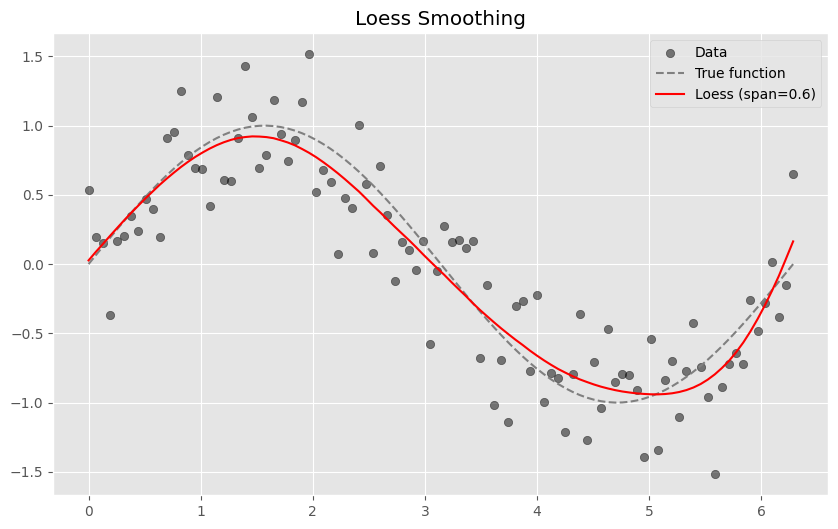

In [78]:
np.random.seed(3)
x = np.linspace(0, 2 * np.pi, 100)
y_true = np.sin(x)
y = y_true + np.random.normal(scale=0.3, size=x.shape)

# Loess function using polynomial regression
def loess(x, y, span=0.6):
    smoothed_y = []
    for i in range(len(x)):
        distances = np.abs(x - x[i])
        weights = (1 - (distances / distances.max()) ** 3) ** 3
        local_idx = weights > (1 - span)
        x_local, y_local, w_local = x[local_idx], y[local_idx], weights[local_idx]

        poly = PolynomialFeatures(degree=2)
        X_poly = poly.fit_transform(x_local[:, None])
        model = LinearGAM(n_splines=10, lam=1)
        model.fit(X_poly, y_local)

        smoothed_y.append(model.predict(poly.transform([[x[i]]]))[0])
    return np.array(smoothed_y)

# Plotting Loess
y_loess = loess(x, y, span=0.6)

plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='black', alpha=0.5, label='Data')
plt.plot(x, y_true, '--', color='gray', label='True function')
plt.plot(x, y_loess, color='red', label='Loess (span=0.6)')
plt.legend()
plt.title('Loess Smoothing')
plt.show()

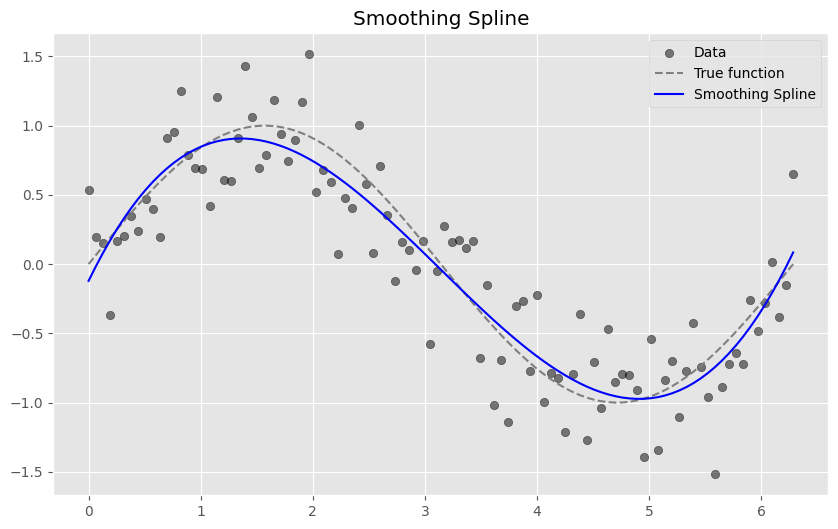

In [74]:
# Smoothing spline with lambda as a smoothness control
spline = UnivariateSpline(x, y, s=10)

plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='black', alpha=0.5, label='Data')
plt.plot(x, y_true, '--', color='gray', label='True function')
plt.plot(x, spline(x), color='blue', label='Smoothing Spline')
plt.legend()
plt.title('Smoothing Spline')
plt.show()

In [79]:
# Scorecard table
scorecard_df = scorecard.table(style="detailed")

In [80]:
scorecard_df.head(10)

,Variable,Bin id,Bin,Count,Count (%),Non-event,Event,Event rate,WoE,IV,JS,Coefficient,Points
0,bc_open_to_buy,0,"(-inf, 328.50)",1890,0.074135,1417,473,0.250265,1.097202,0.081255,0.009676,1.064039,-6.499549
1,bc_open_to_buy,1,"[328.50, 912.50)",1809,0.070958,1254,555,0.306799,0.815126,0.044699,0.005438,1.064039,-1.601791
2,bc_open_to_buy,2,"[912.50, 1703.50)",1862,0.073037,1191,671,0.360365,0.573779,0.023407,0.002886,1.064039,2.588762
3,bc_open_to_buy,3,"[1703.50, 3880.50)",3771,0.147917,2270,1501,0.398038,0.413648,0.024955,0.003097,1.064039,5.369158
4,bc_open_to_buy,4,"[3880.50, 8554.00)",5644,0.221385,3081,2563,0.454111,0.184076,0.007480,0.000934,1.064039,9.355281
5,bc_open_to_buy,5,"[8554.00, 11832.00)",2346,0.092022,1065,1281,0.546036,-0.184666,0.003129,0.000391,1.064039,15.757838
6,bc_open_to_buy,6,"[11832.00, 15213.00)",1671,0.065545,654,1017,0.608618,-0.441505,0.012573,0.001559,1.064039,20.217392
7,bc_open_to_buy,7,"[15213.00, 24556.00)",2835,0.111203,983,1852,0.653263,-0.633412,0.043182,0.005309,1.064039,23.549525
8,bc_open_to_buy,8,"[24556.00, 39016.50)",2045,0.080215,556,1489,0.728117,-0.985092,0.072103,0.008665,1.064039,29.655820
9,bc_open_to_buy,9,"[39016.50, inf)",1621,0.063584,276,1345,0.829735,-1.583748,0.132818,0.015059,1.064039,40.050441


In [81]:
# Wrapper function for predictions (predict probabilities)
def predict_proba_wrapper(data):
    if isinstance(data, np.ndarray):
        # Convert to DataFrame with suitable column names
        data = pd.DataFrame(data, columns=X_train_balanced_encoded_df.columns)
    return scorecard.predict_proba(data)

#Metircs Calculation

In [82]:
def metric(y_true, y_pred, return_components=False) -> float:
    def top_percent_captured(df, percentile=90) -> float:
        # Assign weight based on the target, higher weight for negative instances
        df['weight'] = df['target'].apply(lambda x: 60 if x == 0 else 1)
        # Calculate the cutoff point for the top 30% of the weight
        cutoff = int((percentile / 100) * df['weight'].sum())
        # Calculate cumulative sum of weights
        df['weight_cumsum'] = df['weight'].cumsum()
        # Find the cutoff in the DataFrame
        df_cutoff = df[df['weight_cumsum'] <= cutoff]
        # Calculate recall: true positives in top 30% / total true positives
        return (df_cutoff['target'] == 1).sum() / (df['target'] == 1).sum()

    def weighted_gini(df):
        # Assign weights similarly as in top_four_percent_captured
        df['weight'] = df['target'].apply(lambda x: 20 if x == 0 else 1)
        # Calculate cumulative sum of normalized weights.
        df['random'] = (df['weight'] / df['weight'].sum()).cumsum()
        # Calculate the cumulative positive rate weighted by the target
        total_pos = (df['target'] * df['weight']).sum()
        df['cum_pos_found'] = (df['target'] * df['weight']).cumsum()
        df['lorentz'] = df['cum_pos_found'] / total_pos
        # Calculate the Gini coefficient using the Lorentz curve and the random curve
        df['gini'] = (df['lorentz'] - df['random']) * df['weight']
        return df['gini'].sum()

    def normalized_weighted_gini(df):
        df2 = pd.DataFrame({'target': df.target, 'prediction': df.target})
        df2.sort_values('prediction', ascending=False, inplace=True)
        # Normalize the actual Gini by the Gini of a perfect model
        return weighted_gini(df) / weighted_gini(df2)

    # Prepare data frame from predictions and targets
    target_data = y_true.to_numpy() if hasattr(y_true, 'to_numpy') else y_true
    prediction_data = y_pred.to_numpy() if hasattr(y_pred, 'to_numpy') else y_pred

    df = pd.DataFrame({'target': target_data, 'prediction': prediction_data})
    df.sort_values('prediction', ascending=False, inplace=True)

    # Calculate metrics
    g = normalized_weighted_gini(df)
    d = top_percent_captured(df, percentile=90)

    return 0.5 * (g + d)

In [83]:
y_train_pred_balanced = scorecard.predict_proba(X_train_balanced_encoded_df)
y_valid_pred = scorecard.predict_proba(X_valid_encoded_df)

# Evaluate the model
train_score_balanced = metric(y_train_balanced.to_numpy(), y_train_pred_balanced)
valid_score = metric(y_valid_binary.to_numpy(), y_valid_pred)

print(f"Train Score: {train_score_balanced:.4f}")
print(f"Validation Score: {valid_score:.4f}")

Train Score: 0.8927
Validation Score: 0.8812


In [84]:
# Performance Metrics
metrics = {
    "Metric": ["AUC-ROC", "Gini Coefficient", "Precision-Recall AUC"],
    "Training Set": [],
    "Validation Set": []
}

# AUC-ROC
train_auc_roc = roc_auc_score(y_train_balanced, y_train_pred_balanced)
valid_auc_roc = roc_auc_score(y_valid_binary, y_valid_pred)
metrics["Training Set"].append(round(train_auc_roc, 4))
metrics["Validation Set"].append(round(valid_auc_roc, 4))

# Gini Coefficient
train_gini = metric(y_train_balanced, y_train_pred_balanced)
valid_gini = metric(y_valid_binary, y_valid_pred)
metrics["Training Set"].append(round(train_gini, 4))
metrics["Validation Set"].append(round(valid_gini, 4))

# Precision-Recall AUC
precision_train, recall_train, _ = precision_recall_curve(y_train_balanced, y_train_pred_balanced)
precision_valid, recall_valid, _ = precision_recall_curve(y_valid_binary, y_valid_pred)
train_pr_auc = auc(recall_train, precision_train)
valid_pr_auc = auc(recall_valid, precision_valid)
metrics["Training Set"].append(round(train_pr_auc, 4))
metrics["Validation Set"].append(round(valid_pr_auc, 4))

metrics_df = pd.DataFrame(metrics)

table = PrettyTable()
table.field_names = ["Metric", "Training Set", "Validation Set"]

for index, row in metrics_df.iterrows():
  table.add_row([row["Metric"], row["Training Set"], row["Validation Set"]])

print("Generalization Performance for GAM:")
print(table)

Generalization Performance for GAM:
+----------------------+--------------+----------------+
|        Metric        | Training Set | Validation Set |
+----------------------+--------------+----------------+
|       AUC-ROC        |    0.8935    |     0.8823     |
|   Gini Coefficient   |    0.8927    |     0.8812     |
| Precision-Recall AUC |    0.8975    |     0.9691     |
+----------------------+--------------+----------------+


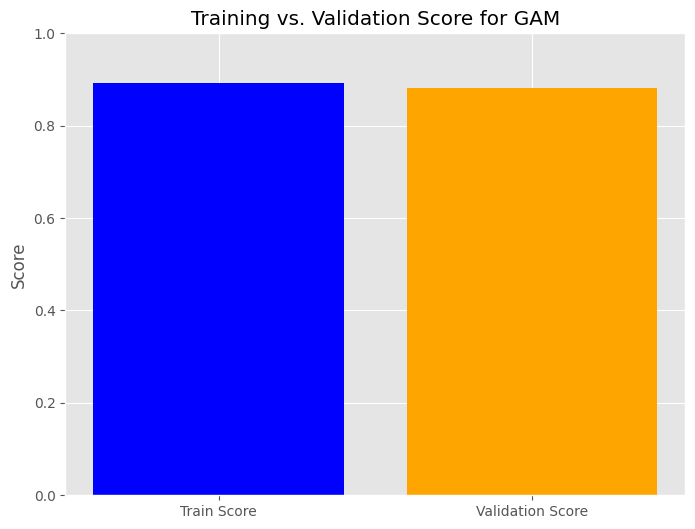

In [85]:
# bar plot to compare the train and validation scores
scores = [train_score_balanced, valid_score]
labels = ['Train Score', 'Validation Score']

plt.figure(figsize=(8, 6))
plt.bar(labels, scores, color=['blue', 'orange'])
plt.title('Training vs. Validation Score for GAM')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.show()

#ROC/AUC Graph

In [86]:
from sklearn import metrics

In [87]:
train_data_balanced['predict_proba'] = y_train_pred_balanced
valid_data['predict_proba'] = y_valid_pred

# Calculate ROC curve and AUC for the undersampled (balanced) training set
fpr_train, tpr_train, thresholds_train = metrics.roc_curve(train_data_balanced['target_binary'], train_data_balanced['predict_proba'])
optimal_idx_train = np.argmax(tpr_train - fpr_train)
optimal_threshold_train = thresholds_train[optimal_idx_train]
auc_score_train = metrics.auc(fpr_train, tpr_train)
print("Optimal Threshold for Train Set:", optimal_threshold_train)

# Calculate ROC curve and AUC for the validation set
fpr_valid, tpr_valid, thresholds_valid = metrics.roc_curve(y_valid_binary, valid_data['predict_proba'])
optimal_idx_valid = np.argmax(tpr_valid - fpr_valid)
optimal_threshold_valid = thresholds_valid[optimal_idx_valid]
auc_score_valid = metrics.auc(fpr_valid, tpr_valid)
print("Optimal Threshold for Validation Set:", optimal_threshold_valid)

print(f"AUC Score (Train): {auc_score_train:.4f}")
print(f"AUC Score (Validation): {auc_score_valid:.4f}")

Optimal Threshold for Train Set: 0.49730819546459915
Optimal Threshold for Validation Set: 0.5188776039002722
AUC Score (Train): 0.8935
AUC Score (Validation): 0.8823


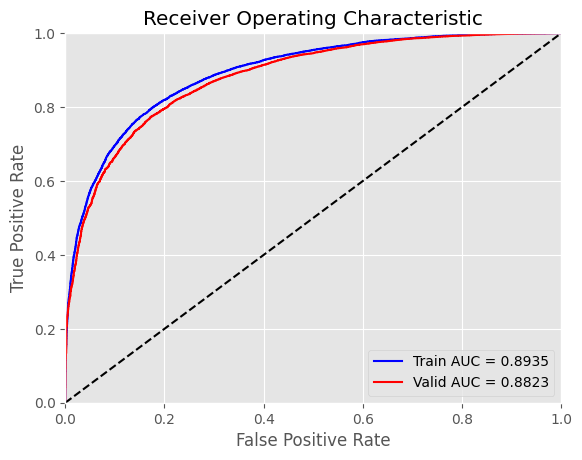

In [88]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr_train, tpr_train, 'b', label=f'Train AUC = {auc_score_train:.4f}')
plt.plot(fpr_valid, tpr_valid, 'r', label=f'Valid AUC = {auc_score_valid:.4f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.legend(loc='lower right')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

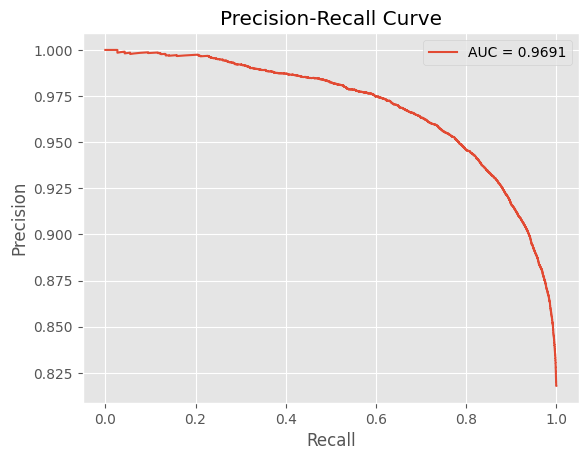

In [89]:
precision, recall, thresholds = precision_recall_curve(y_valid_binary, y_valid_pred)
plt.plot(recall, precision, label=f'AUC = {auc(recall, precision):.4f}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend(loc='best')
plt.show()

Brier Score for Validation Data: 0.1410


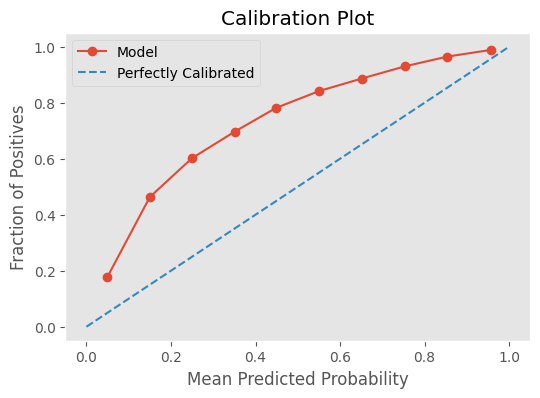

In [90]:
# Compute Brier score for validation predictions
brier_score = brier_score_loss(y_valid_binary, y_valid_pred)
print(f"Brier Score for Validation Data: {brier_score:.4f}")

prob_true, prob_pred = calibration_curve(y_valid_binary, y_valid_pred, n_bins=10)

# Plot the calibration curve
plt.figure(figsize=(6, 4))
plt.plot(prob_pred, prob_true, marker='o', label='Model')
plt.plot([0, 1], [0, 1], linestyle='--', label='Perfectly Calibrated')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Plot')
plt.legend()
plt.grid()
plt.show()

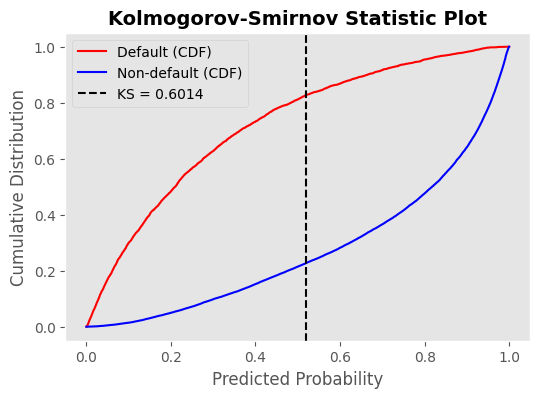

Kolmogorov-Smirnov (KS) Statistic: 0.6014
Threshold at KS: 0.5188


In [91]:
# Combine predicted probabilities and true labels into a single DataFrame
ks_data = pd.DataFrame({
    'y_true': y_valid_binary,
    'y_prob': y_valid_pred
})

ks_data = ks_data.sort_values(by='y_prob')

# Compute cumulative distributions
ks_data['cum_default'] = (ks_data['y_true'] == 0).cumsum() / (ks_data['y_true'] == 0).sum()
ks_data['cum_non_default'] = (ks_data['y_true'] == 1).cumsum() / (ks_data['y_true'] == 1).sum()

# Calculate KS statistic and its location
ks_data['ks_diff'] = np.abs(ks_data['cum_default'] - ks_data['cum_non_default'])
ks_statistic = ks_data['ks_diff'].max()
ks_index = ks_data['ks_diff'].idxmax()

# Get the corresponding threshold value
ks_threshold = ks_data.loc[ks_index, 'y_prob']

plt.figure(figsize=(6, 4))
plt.plot(ks_data['y_prob'], ks_data['cum_default'], label='Default (CDF)', color='red')
plt.plot(ks_data['y_prob'], ks_data['cum_non_default'], label='Non-default (CDF)', color='blue')
plt.axvline(x=ks_threshold, color='black', linestyle='--', label=f"KS = {ks_statistic:.4f}")

plt.title("Kolmogorov-Smirnov Statistic Plot", fontweight="bold", fontsize=14)
plt.xlabel("Predicted Probability")
plt.ylabel("Cumulative Distribution")
plt.legend()
plt.grid()
plt.show()

print(f"Kolmogorov-Smirnov (KS) Statistic: {ks_statistic:.4f}")
print(f"Threshold at KS: {ks_threshold:.4f}")

#Classification Report

In [92]:
# Ensure the predictions are being applied to the correct DataFrame (train_data_balanced)
train_data_balanced['predict'] = (y_train_pred_balanced > optimal_threshold_train).astype(int)
valid_data['predict'] = (y_valid_pred > optimal_threshold_train).astype(int)

# Check if there are any NaN values in predictions
if not train_data_balanced['predict'].isnull().any() and not valid_data['predict'].isnull().any():
    print("Classification Report - Training Data:")
    print(metrics.classification_report(train_data_balanced['target_binary'], train_data_balanced['predict'], labels=[0, 1]))
    print("")
    print("Classification Report - Validation Data:")
    print(metrics.classification_report(valid_data['target_binary'], valid_data['predict'], labels=[0, 1]))
else:
    print("Error: NaN values found in binary predictions.")

Classification Report - Training Data:
              precision    recall  f1-score   support

           0       0.80      0.83      0.81     12747
           1       0.82      0.80      0.81     12747

    accuracy                           0.81     25494
   macro avg       0.81      0.81      0.81     25494
weighted avg       0.81      0.81      0.81     25494


Classification Report - Validation Data:
              precision    recall  f1-score   support

           0       0.46      0.81      0.59      5463
           1       0.95      0.79      0.86     24537

    accuracy                           0.79     30000
   macro avg       0.70      0.80      0.72     30000
weighted avg       0.86      0.79      0.81     30000



#Confussion Matrix

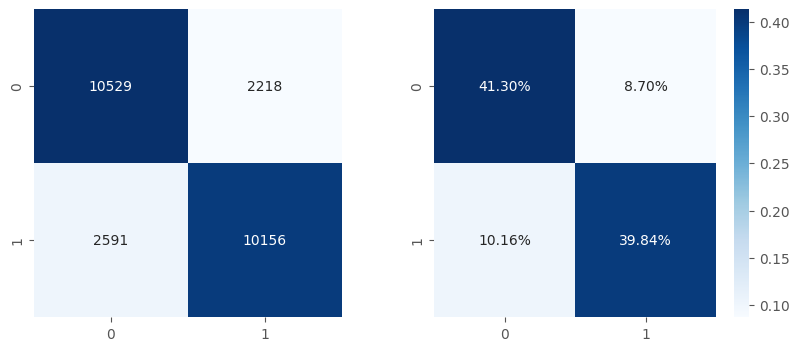

In [93]:
conf_mat = metrics.confusion_matrix(train_data_balanced['target_binary'], train_data_balanced['predict'])
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))

sns.heatmap(conf_mat, square=True, annot=True, cmap='Blues', fmt='d', cbar=False, ax=ax1)
sns.heatmap(conf_mat / np.sum(conf_mat), annot=True, fmt='.2%', cmap='Blues', ax=ax2)
plt.show()

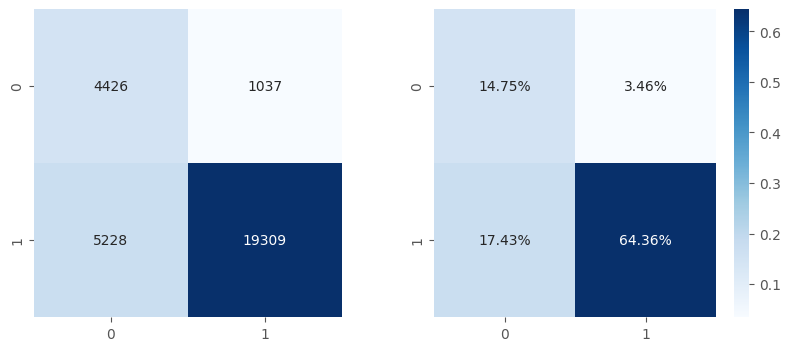

In [94]:
conf_mat = metrics.confusion_matrix(valid_data['target_binary'], valid_data['predict'])
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,4))

sns.heatmap(conf_mat, square=True, annot=True, cmap='Blues', fmt='d', cbar=False, ax=ax1)
sns.heatmap(conf_mat/np.sum(conf_mat), annot=True, fmt='.2%', cmap='Blues', ax=ax2)
plt.show()

#Scores

In [95]:
# separate DataFrame for adjusted data
train_data_balanced = pd.DataFrame(X_train_balanced_encoded_df, columns=variable_names)
train_data_balanced['target_binary'] = y_train_balanced

In [96]:
# Assign scores to the balanced training data
train_data_balanced['score'] = scorecard.score(X_train_balanced_encoded_df)

In [97]:
# assign scores to the training and validation data
train_data['score'] = scorecard.score(X_train_encoded_df)
valid_data['score'] = scorecard.score(X_valid_encoded_df)

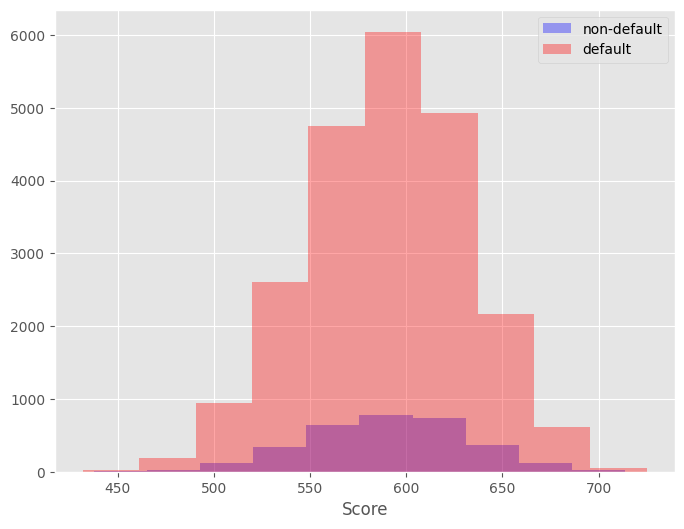

In [98]:
# Extract target and score
y_test = train_data_balanced['target_binary']
score = train_data_balanced['score']

# Create mask for non-default class (target_binary == 0)
mask = y_test == 0

fig, ax = plt.subplots(figsize=(8, 6))
plt.hist(score[mask], label="non-default", color="b", alpha=0.35)
plt.hist(score[~mask], label="default", color="r", alpha=0.35)
plt.xlabel("Score")
plt.legend()
plt.show()

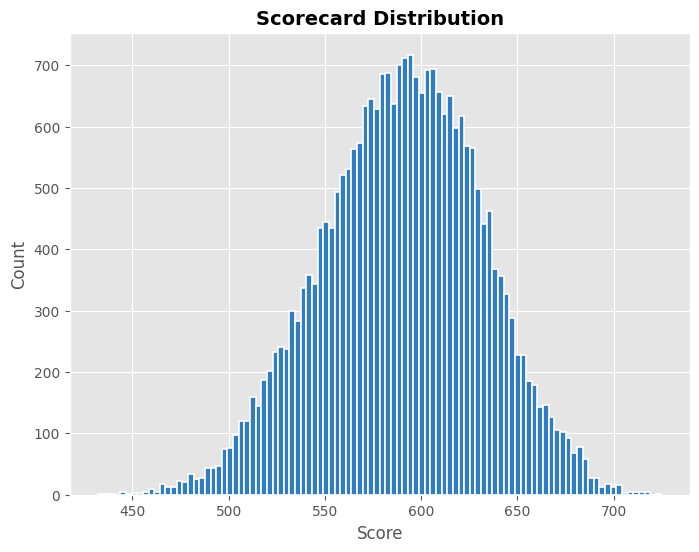

In [99]:
# Plot Distribution of Scores
plt.figure(figsize=(8, 6))

plt.hist(score,
         bins=100,
         edgecolor='white',
         color = '#317DC2',
         linewidth=1.2)

plt.title('Scorecard Distribution', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Count')
plt.show()

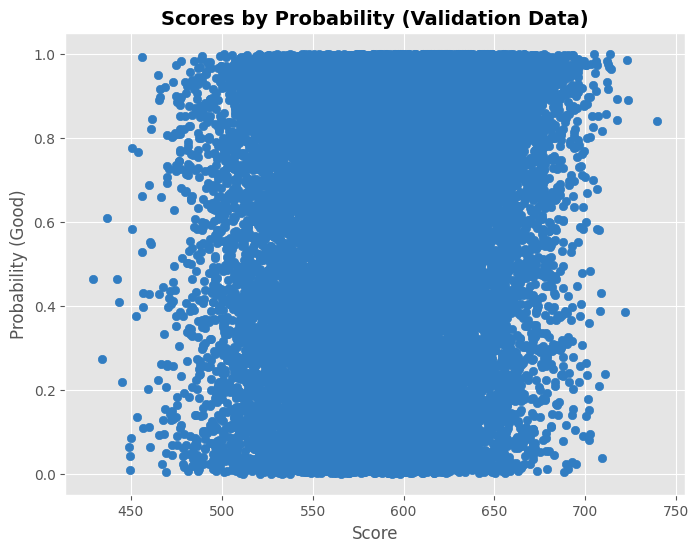

In [100]:
# Plot Scores Against Probabilities for the Validation Data
plt.figure(figsize=(8, 6))

plt.scatter(x=valid_data['score'],
            y=valid_data['predict_proba'],
            color='#317DC2')

plt.title('Scores by Probability (Validation Data)', fontweight="bold", fontsize=14)
plt.xlabel('Score')
plt.ylabel('Probability (Good)')
plt.show()

#Model Comparisson

Training Logistic Regression...
Training Decision Tree...
Training Random Forest...
Training LightGBM...
[LightGBM] [Info] Number of positive: 12747, number of negative: 12747
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005165 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5719
[LightGBM] [Info] Number of data points in the train set: 25494, number of used features: 46
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Training Neural Network...
Training GAM...


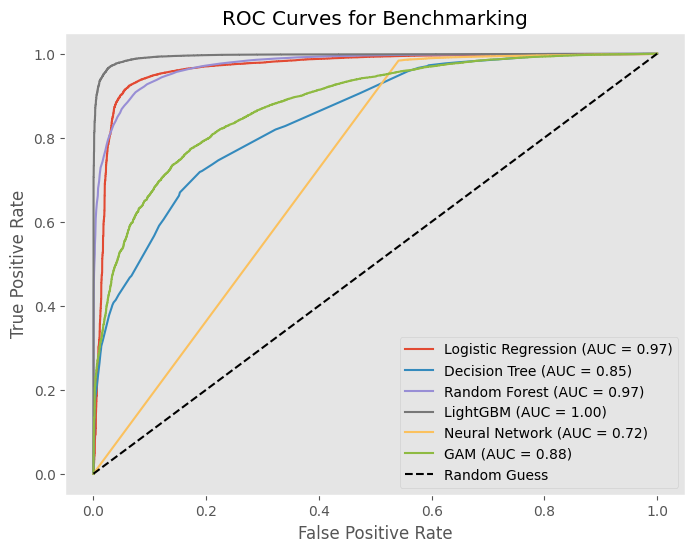

In [101]:
# Benchmark models
models = {
    "Logistic Regression": LogisticRegression(max_iter=2000, random_state=42),
    "Decision Tree": DecisionTreeClassifier(max_depth=6, random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "LightGBM": LGBMClassifier(n_estimators=100, random_state=42),
    "Neural Network": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42),
    "GAM": scorecard
}

# Results container
evaluation_results = {
    "Model": [],
    "AUC-ROC": [],
    "KS Statistic": [],
    "Precision-Recall AUC": [],
    "Gini Coefficient": [],
    "Brier Score": []
}


plt.figure(figsize=(8, 6))
plt.title("ROC Curves for Benchmarking")


# Train and evaluate each model
for model_name, model in models.items():
    print(f"Training {model_name}...")
    if model_name != "GAM":
        model.fit(X_train_balanced_encoded, y_train_balanced)

    if model_name == "GAM":
        y_valid_pred = scorecard.predict_proba(X_valid_encoded_df)
    else:
        y_valid_pred = model.predict_proba(X_valid_encoded)[:, 1]

    # AUC-ROC
    auc_roc = roc_auc_score(y_valid_binary, y_valid_pred)
    evaluation_results["AUC-ROC"].append(auc_roc)

    # KS Statistic
    ks_stat = ks_2samp(y_valid_binary, y_valid_pred)
    evaluation_results["KS Statistic"].append(ks_stat)

    # Precision-Recall AUC
    precision, recall, _ = precision_recall_curve(y_valid_binary, y_valid_pred)
    pr_auc = auc(recall, precision)
    evaluation_results["Precision-Recall AUC"].append(pr_auc)

    # Gini Coefficient
    gini_coeff = (2 * auc_roc) - 1
    evaluation_results["Gini Coefficient"].append(gini_coeff)

    # Brier Score
    brier = brier_score_loss(y_valid_binary, y_valid_pred)
    evaluation_results["Brier Score"].append(brier)

    # Plot ROC curve
    fpr, tpr, _ = roc_curve(y_valid_binary, y_valid_pred)
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {auc_roc:.2f})")

    evaluation_results["Model"].append(model_name)


# ROC plot
plt.plot([0, 1], [0, 1], 'k--', label="Random Guess")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend()
plt.grid()
plt.show()

In [102]:
evaluation_df = pd.DataFrame(evaluation_results)
print("\nBenchmakred Evaluation Results:")
print(tabulate(evaluation_df, headers='keys', tablefmt='psql'))


Benchmakred Evaluation Results:
+----+---------------------+-----------+------------------------------------------------------------------------------------------------------------------+------------------------+--------------------+---------------+
|    | Model               |   AUC-ROC | KS Statistic                                                                                                     |   Precision-Recall AUC |   Gini Coefficient |   Brier Score |
|----+---------------------+-----------+------------------------------------------------------------------------------------------------------------------+------------------------+--------------------+---------------|
|  0 | Logistic Regression |  0.967566 | KstestResult(statistic=0.8179, pvalue=0.0, statistic_location=0.9999999999673843, statistic_sign=-1)             |               0.989342 |           0.935131 |     0.0697559 |
|  1 | Decision Tree       |  0.84751  | KstestResult(statistic=0.8060999999999999, pvalue=0.0,

In [103]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# for Logistic Regression
log_reg = LogisticRegression(max_iter=2000, random_state=42)
scores = cross_val_score(log_reg, X_train_balanced_encoded_df, y_train_balanced, cv=cv, scoring="roc_auc")
print(f"Logistic Regression AUC-ROC: {scores.mean():.4f} ± {scores.std():.4f}")

param_grid = {'C': [0.001, 0.01, 0.1, 1, 10, 100]}
log_reg = LogisticRegression(max_iter=2000, random_state=42)
grid_search = GridSearchCV(log_reg, param_grid, scoring='roc_auc', cv=5)
grid_search.fit(X_train_balanced_encoded_df, y_train_balanced)
print(f"Best C: {grid_search.best_params_}")
print(f"Best AUC-ROC: {grid_search.best_score_:.4f}")

Logistic Regression AUC-ROC: 0.9665 ± 0.0015
Best C: {'C': 0.1}
Best AUC-ROC: 0.9670


# Feature Benchmarking Contribution (FCB)

In [104]:
# Install dependencies
!CMAKE_ARGS="-DLLAMA_CUBLAS=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.1.78 numpy==1.23.4 --force-reinstall --upgrade --no-cache-dir --verbose
!pip install huggingface_hub
!pip install llama-cpp-python==0.1.78
!pip install numpy==1.23.4

Using pip 24.1.2 from /usr/local/lib/python3.11/dist-packages/pip (python 3.11)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 77.1 MB/s eta 0:00:00
  Running command pip subprocess to install build dependencies
  Using pip 24.1.2 from /usr/local/lib/python3.11/dist-packages/pip (python 3.11)
  Non-user install by explicit request
  Created build tracker: /tmp/pip-build-tracker-ez2ccxj9
  Entered build tracker: /tmp/pip-build-tracker-ez2ccxj9
  Created temporary directory: /tmp/pip-install-1rct7yc5
  Created temporary directory: /tmp/pip-ephem-wheel-cache-c9am0sxf
  1 location(s) to search for versions of setuptools:
  * https://pypi.org/simple/setuptools/
  Fetching project page and analyzing links: https://pypi.org/simple/setuptools/
  Getting page https://pypi.org/simple/setuptools/
  Found index url https://pypi.org/simple/
  Looking up "https://pypi.org/simple/setuptools/" in the cache
  Request header has "max_age" as 0, cache bypassed
  No cache entry available
  Start

In [105]:
from huggingface_hub import hf_hub_download
from llama_cpp import Llama
from sklearn.utils import shuffle
from sklearn.cluster import KMeans
from tqdm import tqdm

In [106]:
# Define LLaMA 2 configuration
model_name_or_path = "TheBloke/Llama-2-13B-chat-GGML"
model_basename = "llama-2-13b-chat.ggmlv3.q5_1.bin"

model_path = hf_hub_download(repo_id=model_name_or_path, filename=model_basename)

# Load the LLaMA model
lcpp_llm = Llama(
    model_path=model_path,
    n_threads=2,
    n_batch=128,
    n_gpu_layers=32)

llama-2-13b-chat.ggmlv3.q5_1.bin:   0%|          | 0.00/9.76G [00:00<?, ?B/s]

AVX = 1 | AVX2 = 1 | AVX512 = 0 | AVX512_VBMI = 0 | AVX512_VNNI = 0 | FMA = 1 | NEON = 0 | ARM_FMA = 0 | F16C = 1 | FP16_VA = 0 | WASM_SIMD = 0 | BLAS = 1 | SSE3 = 1 | VSX = 0 | 


In [115]:
# Wrapper function for predictions
def predict_proba_wrapper(data):
    if isinstance(data, np.ndarray):
        data = pd.DataFrame(data, columns=X_train_balanced_encoded_df.columns)
    return scorecard.predict_proba(data)


# generate narratives with LLaMA
def generate_narratives_with_llama(batch_prompts, llama_instance):
    narratives = []
    for prompt in tqdm(batch_prompts, desc="Generating FCB Narratives"):
      prompt_template = f"""
      Your task is to analyze the SHAP values and provide a concise and actionable narrative explanation, explaining the credit score prediction for an individual.

      Guidlines:
      1. Identify the top contributing features and their SHAP values affecting the individual's credit score value.
      2. Compare the individual's feature values to against subgroup averages, focusing on deviations for the top features.
      3. Provide actionable recommendations for the individual to improve and maintain the credit score.

      Data:
      - Top Features & SHAP Values: {prompt['features']}
      - Subgroup Averages (top features): {prompt['subgroup_averages']}
      - Deviations from Subgroup (top features): {prompt['deviations']}

      """
      try:
          response = llama_instance(
              prompt=prompt_template, max_tokens=150, temperature=0.5, top_p=0.95,
              repeat_penalty=1.2, top_k=150, echo=False
          )
          narrative = response["choices"][0]["text"].strip()
          narratives.append(narrative)
      except Exception as e:
          print(f"Error generating narrative: {e}")
          narratives.append("Error generating narrative. Please retry.")
    return narratives


# generate insights as batches
class LLaMANarrativeGenerator:
  def __init__(self, llama_instance):
      self.llama_instance = llama_instance

  def generate_batch_insights(self, shap_df, top_features, subgroup_averages, batch_size=5):
      narratives = []
      for i in tqdm(range(0, len(shap_df), batch_size), desc="Generating Narratives"):
        batch = shap_df.iloc[i:i + batch_size]
        batch_prompts = [
            {
              'features': row[top_features].to_dict(),
              'subgroup': row.get('subgroup', 'N/A'),
              'subgroup_averages': subgroup_averages,
              'deviations': {
                  feature: row[feature] - subgroup_averages.get(feature, 0)
                  for feature in top_features
              }
            }
            for _, row in batch.iterrows()
        ]
        narratives.extend(generate_narratives_with_llama(batch_prompts, self.llama_instance))
      return narratives


# SHAP loading and clustering
def load_or_compute_shap(X_train_balanced_encoded_df, X_valid_encoded_df, scorecard, sample_size=10):
    shap_values_path = "/content/drive/MyDrive/FYP /AI Alignment/Test/data/shap_values.npy"
    if os.path.exists(shap_values_path):
        shap_values_positive = np.load(shap_values_path)
    else:
        background_sample = X_train_balanced_encoded_df.sample(sample_size, random_state=42)
        explainer = shap.KernelExplainer(predict_proba_wrapper, background_sample)
        shap_values = explainer.shap_values(X_valid_encoded_df[:sample_size])
        shap_values_positive = shap_values[1] if isinstance(shap_values, list) else shap_values
        os.makedirs(os.path.dirname(shap_values_path), exist_ok=True)
        np.save(shap_values_path, shap_values_positive)
    return shap_values_positive


# SHAP and clustering process
def cluster_on_sample(shap_df, X_valid_encoded_df, selected_features, subgroup_features, sample_size=10):
    clustering_data = pd.concat([shap_df[selected_features], X_valid_encoded_df[subgroup_features]], axis=1)
    clustering_data_sample = shuffle(clustering_data, random_state=42).iloc[:sample_size]
    kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
    full_clusters = kmeans.fit_predict(clustering_data)
    shap_df['subgroup'] = full_clusters
    return shap_df, kmeans


# Compute credit scores for validation set
valid_data['credit_score'] = scorecard.score(X_valid_encoded_df).round(2)


# Generate SHAP explanations
def fast_explain_shap(shap_values_positive, X_valid_encoded_df, valid_data, selected_features, top_k=4):
    selected_features = X_valid_encoded_df.columns[:-1]
    shap_values_positive = shap_values_positive[:, :len(selected_features)]

    # Subsample for testing
    X_valid_encoded_df = X_valid_encoded_df.head(10).reset_index(drop=True)
    valid_data = valid_data.head(10).reset_index(drop=True)

    shap_df = pd.DataFrame(shap_values_positive, columns=selected_features)
    shap_df['member_id'] = valid_data['member_id'].values
    shap_df['credit_score'] = valid_data['credit_score'].values

    # Compute feature importance
    feature_importance = shap_df[selected_features].abs().mean()
    top_features = feature_importance.nlargest(top_k).index.tolist()

    # Clustering for subgroup analysis
    subgroup_features = selected_features
    shap_df, kmeans = cluster_on_sample(shap_df, X_valid_encoded_df, selected_features, subgroup_features, sample_size=10)

    # Compute subgroup averages
    subgroup_averages = shap_df.groupby('subgroup')[top_features].mean().to_dict(orient='index')
    flattened_subgroup_averages = {k: v for subgroup, features in subgroup_averages.items() for k, v in features.items()}

    return shap_df, top_features, flattened_subgroup_averages


# Workflow
shap_values_positive = load_or_compute_shap(X_train_balanced_encoded_df, X_valid_encoded_df, scorecard)

shap_df, top_features, subgroup_averages = fast_explain_shap(
    shap_values_positive=shap_values_positive,
    X_valid_encoded_df=X_valid_encoded_df,
    valid_data=valid_data,
    selected_features=X_valid_encoded_df.columns,
    top_k=2
)

narrative_generator = LLaMANarrativeGenerator(lcpp_llm)

# Generate narratives
shap_df["narrative_insights"] = narrative_generator.generate_batch_insights(shap_df, top_features, subgroup_averages, batch_size=10)

final_report = shap_df[["member_id", "credit_score", "narrative_insights"]]
final_report.to_csv("/content/drive/MyDrive/FYP /AI Alignment/Test/data/FCB_with_narratives.csv", index=False)
joblib.dump(shap_df[['member_id', 'narrative_insights']], "/content/drive/MyDrive/FYP /AI Alignment/Test/data/FCB_Narratives.joblib")
print("FCB narratives saved as joblib & CSV")

Generating FCB Narratives:   0%|          | 0/10 [00:00<?, ?it/s]Llama.generate: prefix-match hit

Generating FCB Narratives:  10%|█         | 1/10 [01:22<12:25, 82.87s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  20%|██        | 2/10 [02:46<11:04, 83.06s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  30%|███       | 3/10 [04:03<09:22, 80.35s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  40%|████      | 4/10 [05:21<07:57, 79.54s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  50%|█████     | 5/10 [06:39<06:34, 78.90s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  60%|██████    | 6/10 [08:06<05:27, 81.85s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  70%|███████   | 7/10 [09:25<04:02, 80.81s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  80%|████████  | 8/10 [10:45<02:40, 80.43s/it]Llama.generate: prefix-match hit

Generating FCB Narratives:  90%|█████████ | 9

FCB narratives saved as joblib & CSV


# Narrative Generation using SHAP

In [ ]:
# class SHAPstory():
#     def __init__(self, api_key, gpt_model="gpt-3.5-turbo"):
#         self.api_key = api_key
#         self.gpt_model = gpt_model

#     def gen_shap_feature_df(self, x, shap_values):
#         shap_df = pd.DataFrame(shap_values, columns=x.columns)
#         return shap_df

#     def generate_prompt(self, instance, shap_values, model_prediction):
#         prompt_string = f"""
#         Given the following SHAP values and model prediction, provide a narrative explanation for the prediction.
#         Instance: {instance}
#         SHAP values: {shap_values}
#         Model Prediction: {model_prediction}
#         """
#         return prompt_string

#     def generate_response(self, prompt, temp=0.2):
#         openai.api_key = self.api_key
#         max_retries = 5
#         base_delay = 1

#         for attempt in range(max_retries):
#             try:
#                 response = openai.ChatCompletion.create(
#                     model=self.gpt_model,
#                     messages=[{"role": "user", "content": prompt}],
#                     temperature=temp,
#                     max_tokens=1000
#                 )
#                 return response.choices[0].message['content']
#             except openai.error.RateLimitError as e:
#                 if attempt == max_retries - 1:
#                     raise
#                 delay = base_delay * (2 ** attempt) + random.uniform(0, 1)
#                 print(f"Rate limit exceeded. Retrying in {delay:.2f} seconds...")
#                 time.sleep(delay)
#             except Exception as e:
#                 print(f"OpenAI API error: {e}")
#                 return "Error: Unable to generate response due to an API error."

#         return "Error: Unable to generate response due to rate limit."

#     def generate_fallback_narrative(self, instance, shap_values, model_prediction):
#       # Need to modify
#         narrative = f"The model predicted a probability of {model_prediction[1]:.2f} for this instance. "
#         for feature, value in shap_values.items():
#             if abs(value) > 0.1:
#                 impact = "positively" if value > 0 else "negatively"
#                 narrative += f"The feature '{feature}' impacted the prediction {impact}. "
#         return narrative

#     def generate_stories(self, model, x, shap_values, temp=0.2):
#         shap_feature_df = self.gen_shap_feature_df(x, shap_values)
#         stories = []
#         for i in range(len(shap_values)):
#             instance = x.iloc[i].to_dict()
#             shap_value = shap_feature_df.iloc[i].to_dict()
#             prediction = model.predict_proba(x.iloc[i:i+1])[0]
#             prompt = self.generate_prompt(instance, shap_value, prediction)
#             try:
#                 story = self.generate_response(prompt, temp)
#             except:
#                 story = self.generate_fallback_narrative(instance, shap_value, prediction)
#             stories.append(story)
#         return stories

In [ ]:
# # Generate narratives using SHAPstory
# shap_story_generator = SHAPstory(api_key='sk-proj-SsXeMUHILg0hasMiADv0T3BlbkFJvxTGTIL8EMl7im9EJsdp')
# explainer = shap.KernelExplainer(predict_proba_wrapper, X_valid_encoded_df)
# shap_values = explainer.shap_values(X_valid_encoded_df[:10])

In [ ]:
# narratives = shap_story_generator.generate_stories(scorecard, X_valid_encoded_df, shap_values)

# for i, story in enumerate(narratives):
#     print(f"Narrative for instance {i}:\n{story}\n")

# SHAP Explanations

In [ ]:
# # SHAP Summary Plot
# shap.summary_plot(shap_values, X_valid_encoded_df)

In [ ]:
# shap.initjs()

# # Get the expected value from the explainer
# expected_value = explainer.expected_value

# # Plot the force plot for the first instance
# shap.plots.force(expected_value, shap_values[0], X_valid_encoded_df.iloc[0])

In [ ]:
# shap.initjs()

# i = 4
# shap.force_plot(explainer.expected_value, shap_values[i], features=X_valid_encoded_df.iloc[i], feature_names=X_valid_encoded_df.columns)

In [ ]:
# explanation = shap.Explanation(
#     # SHAP values for the first instance
#     values=shap_values[0],
#     base_values=explainer.expected_value,
#     data=X_valid_encoded_df.iloc[0].values,
#     feature_names=X_valid_encoded_df.columns
# )

# # plot the waterfall plot using the Explanation object
# shap.plots.waterfall(explanation)

In [ ]:
# shap.summary_plot(shap_values, features=X_valid_encoded_df, feature_names=X_valid_encoded_df.columns, plot_type='bar')

# Combine meterological data for disaster validation


In [ ]:
# Function to extract disaster type and date from text
def extract_disaster_info(details):
    prompt = f"""
    Your task is to extract the type of disaster and the date from the following text:

    Details: {details}

    Return the results in the format:
    Disaster Type: <type>
    Date: <date>
    """

    try:
        response = openai.ChatCompletion.create(
            model="gpt-3.5-turbo",
            messages=[{"role": "user", "content": prompt}],
            temperature=0
        )
        extracted_text = response.choices[0].message['content'].strip()
    except Exception as e:
        print(f"Error extracting data: {e}")
        return None, None

    # Extract the disaster type and date using regex
    lines = extracted_text.split("\n")
    disaster_type = next((line.replace("Disaster Type:", "").strip() for line in lines if "Disaster Type:" in line), None)
    disaster_date = next((line.replace("Date:", "").strip() for line in lines if "Date:" in line), None)

    return disaster_type, disaster_date

df_loaded[['Disaster Type', 'Disaster Date']] = df_loaded['Details'].apply(lambda x: pd.Series(extract_disaster_info(x)))
print(tabulate(df_loaded, headers='keys', tablefmt='pretty'))

In [ ]:
# Function to extract date in YYYY-MM-DD format
def extract_date(text):
    prompt = f"""
    Extract the date from the following text and return it in YYYY-MM-DD format:

    Text: {text}

    If the date is not found, return 'None'.
    """

    try:
        response = openai.ChatCompletion.create(
            model='gpt-3.5-turbo',
            messages=[{"role": "user", "content": prompt}],
            temperature=0,
            max_tokens=1000
        )
        extracted_text = response.choices[0].message['content'].strip()
    except Exception as e:
        print(f"Error extracting date: {e}")
        return None

    date_match = re.search(r"\b\d{4}-\d{2}-\d{2}\b", extracted_text)
    return date_match.group(0) if date_match else None

In [ ]:
# Apply the function to extract disaster type and date from details
df_loaded[['Disaster Type', 'Disaster Date']] = df_loaded['Details'].apply(lambda x: pd.Series(extract_disaster_info(x)))

# Apply the function to extract disaster dates
df_loaded['Extracted_Date'] = df_loaded['Disaster Date'].apply(extract_date)

# Retain original non-encoded columns
original_columns_to_keep = ['member_id', 'loan_purpose', 'loan_issue_date']
train_data, valid_data = train_test_split(train_df, test_size=0.3, random_state=42, stratify=train_df['grade'])

# Store original copies before encoding
valid_data_original = valid_data[original_columns_to_keep].copy()

In [ ]:
# Ensure restored columns exist before referencing them
if all(col in valid_data_original.columns for col in original_columns_to_keep):
    valid_data['member_id'] = valid_data_original['member_id'].values
    valid_data['loan_purpose'] = valid_data_original['loan_purpose'].values
    valid_data['loan_issue_date'] = valid_data_original['loan_issue_date'].values
else:
    print("Warning: Some of the original columns were not found!")

# Define disaster-related keywords
disaster_keywords = [
    "disaster", "flood", "cyclone", "drought", "earthquake",
    "storm", "hurricane", "wildfire", "damage"]

In [ ]:
# Function to calculate time elapsed
def calculate_time_elapsed(disaster_date, loan_issue_date):
    try:
        if pd.isna(disaster_date) or pd.isna(loan_issue_date):
            return None

        disaster_date = datetime.strptime(disaster_date, "%Y-%m-%d")
        loan_issue_date = datetime.strptime(loan_issue_date, "%Y-%m-%d")
        return max((loan_issue_date - disaster_date).days / 365.0, 0)
    except Exception as e:
        print(f"Error parsing dates: {e}")
        return None


# Function to validate disaster claim
def validate_disaster_claim(customer_row, weather_df, time_window=30):
  loan_purpose = str(customer_row.get('loan_purpose', '')).lower()

  if any(keyword in loan_purpose for keyword in disaster_keywords):
    matching_state = weather_df[weather_df['state_code'] == customer_row.get('addr_state')]

    loan_date_str = customer_row.get('loan_issue_date')
    if pd.isna(loan_date_str) or not loan_date_str:
        return 0
    try:
        loan_date = datetime.strptime(loan_date_str, "%Y-%m-%d")
    except ValueError:
        return 0

    for _, weather_row in matching_state.iterrows():
        disaster_type = str(weather_row.get('Disaster Type', '')).lower()
        disaster_date_str = weather_row.get('Extracted_Date')

        if pd.isna(disaster_date_str) or not disaster_date_str:
            continue
        try:
            disaster_date = datetime.strptime(disaster_date_str, "%Y-%m-%d")
        except ValueError:
            continue

        if disaster_type in loan_purpose and abs((loan_date - disaster_date).days) <= time_window:
            return 1
    return 0

In [ ]:
# Apply disaster validation
valid_data['validated_disaster'] = valid_data.apply(lambda row: validate_disaster_claim(row, df_loaded), axis=1)

valid_data['credit_score'] = scorecard.score(X_valid_encoded_df).round(2)

In [ ]:
# Function to adjust credit score using time-decay logic
def adjust_credit_score_with_time_decay(row, base_adjustment=50, decay_param=0.5):
    if row['validated_disaster'] == 1:
        time_elapsed = calculate_time_elapsed(row['Disaster Date'], row['loan_issue_date'])
        if time_elapsed is None:
            return row['credit_score']

        decay_factor = np.exp(-decay_param * time_elapsed)
        adjustment = base_adjustment * decay_factor
        return min(row['credit_score'] + adjustment, 850)

    return row['credit_score']

In [ ]:
valid_data['validated_disaster'] = train_df.apply(lambda row: validate_disaster_claim(row, df_loaded), axis=1)

# Adjust credit scores based on time-decay logic
valid_data['adjusted_credit_score'] = valid_data.apply(lambda row: adjust_credit_score_with_time_decay(row), axis=1)

# print(tabulate(valid_data[['member_id', 'loan_purpose', 'loan_issue_date', 'credit_score', 'adjusted_credit_score']].head(), headers='keys', tablefmt='pretty'))
valid_data = valid_data.merge(shap_df[["member_id", "narrative_insights"]], on="member_id", how="left")
print(tabulate(valid_data[["member_id", "loan_purpose", "loan_issue_date", "credit_score", "adjusted_credit_score", "narrative_insights"]].head(), headers='keys', tablefmt='pretty'))


validated_records = valid_data[valid_data['validated_disaster'] == 1]

if not validated_records.empty:
  print("Validated Disaster record/s found:")
else:
  print("No validated disaster records found.")

# Save the final report with narratives
valid_data.to_csv("/content/drive/MyDrive/FYP /AI Alignment/Test/data/Final_FCB_Report_with_scores.csv", index=False)
joblib.dump(valid_data, "/content/drive/MyDrive/FYP /AI Alignment/Test/data/FCB_Report_with_scores.joblib")

In [ ]:
# # Apply time-decay logic
# valid_data['adjusted_credit_score'] = valid_data.apply(adjust_credit_score_with_time_decay, axis=1)

# # Display results
# required_columns = ['member_id', 'loan_purpose', 'loan_issue_date', 'credit_score', 'adjusted_credit_score']
# missing_columns = [col for col in required_columns if col not in valid_data.columns]

# if missing_columns:
#     print(f"Warning: The following columns are missing: {missing_columns}")
# else:
#     print(tabulate(valid_data[required_columns].head(), headers='keys', tablefmt='pretty'))

# # Display validated disaster records
# validated_records = valid_data[valid_data['validated_disaster'] == 1]
# if not validated_records.empty:
#     print("Validated disaster records found:")
#     print(tabulate(validated_records[required_columns], headers='keys', tablefmt='pretty'))
# else:
#     print("No validated disaster records found.")

In [ ]:
# valid_data = valid_data.merge(shap_df[["member_id", "narrative_insights"]], on="member_id", how="left")

# # Print sample output for validation
# print(" Sample Output with Narratives:")
# print(valid_data[["member_id", "loan_purpose", "loan_issue_date", "credit_score", "adjusted_credit_score", "narrative_insights"]].head())

# # Save the final report with narratives
# valid_data.to_csv("/content/drive/MyDrive/FYP /AI Alignment/Test/data/Final_FCB_Report_with_Narratives.csv", index=False)
# joblib.dump(valid_data, "/content/drive/MyDrive/FYP /AI Alignment/Test/data/FCB_Narratives_with_Scores.joblib")

# print("FCB Narratives successfully integrated & saved!")

In [ ]:
# # Retain original non-encoded columns
# original_columns_to_keep = ['member_id', 'loan_purpose', 'loan_issue_date']

# train_data, valid_data = train_test_split(
#     train_df[selected_features.tolist() + ['grade', 'member_id']],
#     test_size=0.3,
#     random_state=42,
#     stratify=train_df['grade']
# )

In [ ]:
# def extract_disaster_info(details):
#     prompt = f"""
#     Your task is to extract the type of disaster and the date from the following text:

#     Details: {details}

#     Return the results in the format:
#     Disaster Type: <type>
#     Date: <date>

#     """

#     try:
#       response = openai.ChatCompletion.create(
#         model="gpt-3.5-turbo",
#         messages=[{"role": "user", "content": prompt}],
#         temperature=0
#       )
#       extracted_text = response.choices[0].message['content'].strip()
#     except Exception as e:
#       print(f"Error extracting data: {e}")
#       return None, None

#     lines = extracted_text.split("\n")

#     disaster_type = None
#     disaster_date = None

#     # Extract the disaster type and date using the expected format
#     for line in lines:
#       if "Disaster Type:" in line:
#           disaster_type = line.replace("Disaster Type:", "").strip()
#       elif "Date:" in line:
#           disaster_date = line.replace("Date:", "").strip()

#     return disaster_type, disaster_date


# df_loaded[['Disaster Type', 'Disaster Date']] = df_loaded['Details'].apply(lambda x: pd.Series(extract_disaster_info(x)))
# print(tabulate(df_loaded, headers='keys', tablefmt='pretty'))

In [118]:
# def extract_date(text):
#     prompt = f"""
#     Your task is to extract the date from the following text and return it in the format YYYY-MM-DD:

#     Text: {text}

#     The output should be in the format: YYYY-MM-DD.
#     If the date is not found, return 'None'.

#     """

#     try:
#       response = openai.ChatCompletion.create(
#           model='gpt-3.5-turbo',
#           messages=[{"role": "user", "content": prompt}],
#           temperature=0,
#           max_tokens=1000
#       )
#       extracted_text = response.choices[0].message['content'].strip()
#     except Exception as e:
#       print(f"Error extracting date: {e}")
#       return None

#     date_match = re.search(r"\b\d{4}-\d{2}-\d{2}\b", extracted_text)
#     if date_match:
#       return date_match.group(0)

#     return None

In [ ]:
# # Apply the function to extract dates from the weather data
# df_loaded['Extracted_Date'] = df_loaded['Disaster Date'].apply(extract_date)

# # Retain original non-encoded columns
# original_columns_to_keep = ['member_id', 'loan_purpose', 'loan_issue_date']

# # Data Splitting
# # train_data, valid_data = train_test_split(train_df[selected_features.tolist() + ['grade', 'member_id']], test_size=0.3, random_state=42, stratify=train_df['grade'])

# # Store original copies before encoding
# valid_data_original = valid_data[original_columns_to_keep].copy()

In [103]:
# # Ensure restored columns exist before referencing them
# if all(col in valid_data_original.columns for col in original_columns_to_keep):
#     valid_data['member_id'] = valid_data_original['member_id'].values
#     valid_data['loan_purpose'] = valid_data_original['loan_purpose'].values
#     valid_data['loan_issue_date'] = valid_data_original['loan_issue_date'].values
# else:
#     print("Warning: Some original columns were not found in valid_data_original!")

In [104]:
# # Function to calculate time elapsed
# def calculate_time_elapsed(disaster_date, loan_issue_date):
#   try:
#     disaster_date = datetime.strptime(disaster_date, "%Y-%m-%d")
#     loan_issue_date = datetime.strptime(loan_issue_date, "%Y-%m-%d")
#     time_elapsed = (loan_issue_date - disaster_date).days / 365.0
#     return max(time_elapsed, 0)
#   except Exception as e:
#     print(f"Error parsing dates: {e}")
#     return None

In [105]:
# # Define the list of disaster related keywords
# disaster_keywords = [
#     "disaster", "flood", "cyclone", "drought", "earthquake",
#     "storm", "hurricane", "wildfire"]

In [106]:
# def validate_disaster_claim(customer_row, weather_df, time_window=30):
#   loan_purpose = str(customer_row['loan_purpose']).lower()

#   # Check if the loan purpose contains any disaster-related keyword
#   if any(keyword in loan_purpose for keyword in disaster_keywords):
#     # Filter the weather data for the matching state
#     matching_state = weather_df[weather_df['state_code'] == customer_row['addr_state']]

#     # Ensure loan_issue_date is present
#     loan_date_str = customer_row.get('loan_issue_date')
#     if pd.isna(loan_date_str) or not loan_date_str:
#         return 0  # Skip validation if loan issue date is missing

#     try:
#         loan_date = datetime.strptime(loan_date_str, "%Y-%m-%d")
#     except ValueError:
#         return 0

#     # Check against the disaster records for the state
#     for _, weather_row in matching_state.iterrows():
#         disaster_type = str(weather_row['Disaster Type']).lower()
#         disaster_date_str = weather_row['Extracted_Date']

#         if not disaster_date_str:
#             continue
#         try:
#             disaster_date = datetime.strptime(disaster_date_str, "%Y-%m-%d")
#         except ValueError:
#             continue

#         # Check if the disaster type matches the loan purpose and if dates align
#         if disaster_type in loan_purpose:
#             if abs((loan_date - disaster_date).days) <= time_window:
#                 return 1
#     return 0

In [107]:
# if 'member_id' in valid_data.columns:
#   member_ids = valid_data['member_id'].copy()
# else:
#   print("'member_id' not found in valid_data. Please check your dataset.")
#   raise KeyError("'member_id' not found in valid_data.")

# # Apply disaster validation
# valid_data['validated_disaster'] = valid_data.apply(lambda row: validate_disaster_claim(row, df_loaded), axis=1)

# # Generate credit scores for the validation data
# valid_data['credit_score'] = scorecard.score(X_valid_encoded_df).round(2)

In [108]:
# # Function to adjust credit score using time-decay logic
# def adjust_credit_score_with_time_decay(row, base_adjustment=50, decay_param=0.5):
#     """
#     Adjust the credit score based on disaster validation and time decay.

#     Parameters:
#     - row: DataFrame row.
#     - base_adjustment: Base score adjustment if the disaster is validated.
#     - decay_param: Exponential decay parameter.

#     """

#     if row['validated_disaster'] == 1:
#       # Calculate time elapsed since disaster
#       time_elapsed = calculate_time_elapsed(row['Disaster Date'], row['Normalized_Loan_Issue_Date'])
#       if time_elapsed is None:
#         return row['credit_score']

#       # Apply time decay
#       decay_factor = np.exp(-decay_param * time_elapsed)
#       adjustment = base_adjustment * decay_factor

#       # Return the adjusted score
#       return min(row['credit_score'] + adjustment, 850)

#     return row['credit_score']

In [ ]:
# # Apply time-decay logic
# valid_data['adjusted_credit_score'] = valid_data.apply(adjust_credit_score_with_time_decay, axis=1)

# # Display results
# required_columns = ['member_id', 'loan_purpose', 'loan_issue_date', 'credit_score', 'adjusted_credit_score']
# missing_columns = [col for col in required_columns if col not in valid_data.columns]

# if missing_columns:
#     print(f"Warning: The following columns are missing: {missing_columns}")
# else:
#     print(tabulate(valid_data[required_columns].head(), headers='keys', tablefmt='pretty'))

# # Display validated disaster records
# validated_records = valid_data[valid_data['validated_disaster'] == 1]
# if not validated_records.empty:
#     print("Validated disaster records found:")
#     print(tabulate(validated_records[required_columns], headers='keys', tablefmt='pretty'))
# else:
#     print("No validated disaster records found.")

#Inference

In [ ]:
# joblib.dump(scorecard, "/content/drive/MyDrive/FYP /AI Alignment/Test/data/trained_model_scorecard.joblib")

In [ ]:
save_path = "/content/drive/MyDrive/FYP /AI Alignment/Test/data/trained_model.joblib"

with open(save_path, "wb") as f:
    dill.dump_session(f)

print(f"Notebook state saved to {save_path}")